#### WordCloud_hashtags
#### Frequency

In [1]:
import twint
import pandas as pd


import networkx as nx
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import powerlaw
warnings.filterwarnings('ignore')


%matplotlib inline 

In [2]:
from wordcloud import WordCloud
import math
from operator import itemgetter
from PIL import Image 
import PIL 

In [3]:
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mir-9\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
path = "../Fridayforfuture/edges.csv"
path_all = "../Fridayforfuture/fff.csv"
path_nodes = "../Fridayforfuture/nodes.csv"

In [6]:
df= pd.read_csv(path_all)

In [9]:
all_string = ""
for i in range(len(df)):
    ll = str(df["clean_tags"][i]).split(",")[:-1]
    for tg in ll:
        all_string = all_string + tg + " "

In [10]:
# Total number of tags
len(all_string.split())

81460

In [12]:
count = 0
for i in range(len(df)):
    ll = str(df["clean_tags"][i]).split(",")[:-1]
    count = count + len(ll)

In [13]:
#Average number of tags per question
count/len(df)

2.3375803489439853

In [14]:
len(set(all_string.split()))

11827

NameError: name 'img_path' is not defined

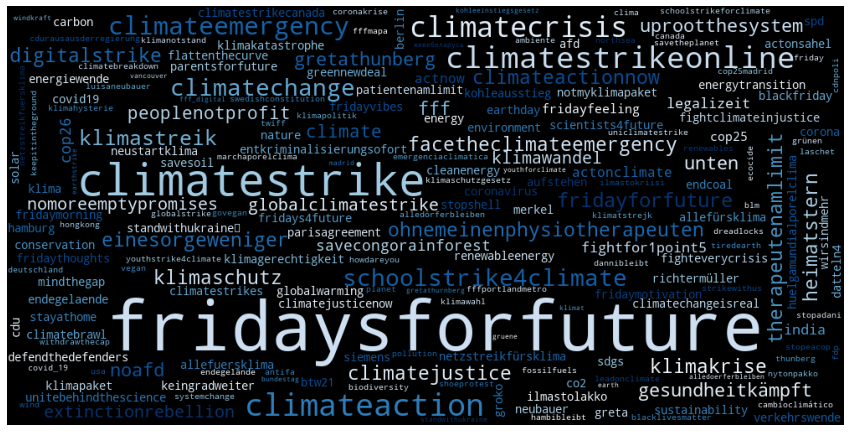

In [15]:
from collections import Counter
word_could_dict=Counter(all_string.split())
wordcloud = WordCloud(width = 1000, height = 500 , colormap="Blues").generate_from_frequencies(word_could_dict)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
#plt.show()
plt.savefig(img_path+'/tag_cloud.png', bbox_inches='tight')
plt.close()

In [16]:
word_could_dict.most_common(6)

[('fridaysforfuture', 14653),
 ('climatestrike', 4363),
 ('climateaction', 1808),
 ('climatestrikeonline', 1720),
 ('climatecrisis', 1563),
 ('climateemergency', 1213)]

In [17]:
for i in range(1, 4):
    print(word_could_dict.most_common()[-i])

('climateambition', 1)
('hips', 1)
('ddop', 1)


### Frequency

In [18]:
from collections import Counter
word_could_dict=Counter(all_string.split())

In [19]:
word_could_dict

Counter({'fossilfuels': 62,
         'wind': 50,
         'solar': 109,
         'green': 20,
         'hydrogen': 6,
         'energy': 95,
         'climateaction': 1808,
         'renewableenergy': 105,
         'carbon': 128,
         'demvoice1': 33,
         'sdgs': 120,
         'climatecrisis': 1563,
         'klimakrise': 656,
         'govegan': 43,
         'fridaysforfuture': 14653,
         'riseupmovement': 31,
         'notmytaxonomy': 11,
         'gocarfree': 4,
         'istayontheground': 2,
         'flightfree': 1,
         'eatonlyplants': 2,
         'shopstop': 2,
         'climatestrike': 4363,
         'climate': 429,
         'savesoilbengaluru': 2,
         'gaskrise': 3,
         'grünen': 54,
         'peoplepower': 5,
         'actnow': 226,
         'climateemergency': 1213,
         'mapa': 27,
         'climatestrikeonline': 1720,
         'fasting': 5,
         'fridays': 9,
         'striking': 1,
         'climatejusticenow': 73,
         'climateac

In [20]:
less_10=0
less_100 =0
over_1000=0
tot_apperance = 0
for i, k in enumerate(word_could_dict):
    if word_could_dict[k] < 100:
        if word_could_dict[k] < 10:
            less_10 += 1
        less_100 +=1
    if word_could_dict[k] > 1000:
        over_1000+=1
    tot_apperance +=1

In [21]:
less_10/tot_apperance

0.9436036188382515

In [22]:
less_100/tot_apperance

0.9934894732391985

In [23]:
over_1000/tot_apperance

0.0005918660691637778

In [25]:
#edges
G = nx.read_edgelist(path, comments = "S", delimiter = ",", data=(("Count", int),))

In [26]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key = itemgetter(1), reverse = True)
print(" ---- Top 20 nodes by degree ----")
for d in sorted_degree[:20]:
    print("\t" + str(d))

 ---- Top 20 nodes by degree ----
	('fridaysforfuture', 11712)
	('climatestrike', 5194)
	('climateaction', 3894)
	('climatecrisis', 3804)
	('climateemergency', 3379)
	('climatechange', 2914)
	('climatejustice', 2856)
	('climatestrikeonline', 2625)
	('klimastreik', 2622)
	('fridayforfuture', 2569)
	('klimaschutz', 2530)
	('klimakrise', 2371)
	('gretathunberg', 2284)
	('climateactionnow', 2239)
	('peoplenotprofit', 2160)
	('nomoreemptypromises', 2104)
	('fff', 2091)
	('uprootthesystem', 1991)
	('climate', 1986)
	('extinctionrebellion', 1954)


In [27]:
node = [i for i in range(0,len(sorted_degree))]
count = []
for i in sorted_degree:
    count.append(i[1])

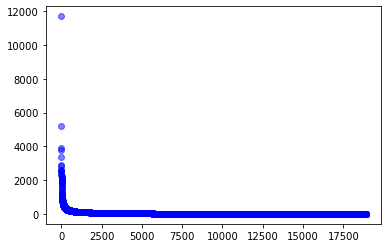

In [28]:
plt.scatter(node, count, c="b", alpha=0.5, )

In [ ]:
## TENTATIVO CON I CODICI DEL PROF

In [29]:
df = pd.read_csv('edges_10k.csv')

In [31]:
#Each row is an edge with a source and a target
G = nx.from_pandas_edgelist(df, source='Source', target='Target')

In [32]:
for n in G.nodes():
    print(n)
    pass

fossilfuels
 wind
 solar
 green
 hydrogen
 energy
 climateaction
 renewableenergy
 carbon
 demvoice1
 sdgs
 climatecrisis
fridaysforfuture
 fridaysforfuture
climatecrisis
 climatestrike
 climate
 actnow
 climateemergency
 climateactionnow
 uprootthesystem
 mindthegap
 globalwarming
 electricity
 sustainability
 renewables
 health
 climatejustice
 peoplenotprofit
climatestrike
 humanity
 planet
science
 earth
 environnement
 co2
 endfossilfuels
 climatestrikeonline
 fossilfuel
climatejustice
 digitalstrike
 climatebreakdown
environment
 systemchange
 extinctionrebellion
 fridayforfuture
climateaction
 fff
 savesoil
 biodiversity
 science
 water
climatechange
 oceans
 fightfor1point5
 ilmastolakko
 nytonpakko
climateactionnow
 climatebrawl
fridayforfuture
 ireland
gretathunberg
 standwithukraine️
 conservation
renewableenergy
 fossilfuels
 energytransition
 future
cleatech
 innovation
 africa
 sustainable
extinctionrebellion
 gas
peoplenotprofit
carbon
 denmark
stopeacop
 floods
 banglad

boston
 bostonclimatestrike
pdx
 portlandclimatestrike
 pdxclimatestrike
nspoli
debenedetti
hamont
emilydickinson
 27settembre
 romeisus
 letterstothearth
 istandwithgretathunberg
 poraccitudine
rightlivelihoodaward
climatestriketo
 climatestriketoronto
 planeta
 accionclimática
suffragettes
 rallyfortheimagination
 artsstrike4climate
 climatestrikedc
 climateactionweek
 klimaatmars
ottawa
climatestrikewr
teamestimzione
27settembre
 ambientalisticolculodeglialtri
ventisette09fr
tweetstorm
palermo
united4climatejustice
teamestinzione
gipuzkoa
 sicily
 trinacria
 sicilia
 southpole
 fridaysforfutureantarctica
heroes
 enviornmentaljustice
 fridaysforfuturenepal
 26settembre
 greennewdemocraticdeal
 ndp
elmomentoesahora
 forourfuture
 letindiabreathe
emergenza
 nobel
palmöl
 kressbronn
 schulzentrum
 bodensee
extra3
 iaademo
 iaablockieren
 youthclimatesummit
 unclimatesummit
 climatweek2019
bolsonaro
 amazzonia
 prayforamazon
youthclimatedeclaration
climateactionsummit
austriaforfuture
ci

 friedenfürsklima
 aktivtrotzcorona
waldbrand
вместезаклимат
 digitlstrike
 letsactnow
 climatestrike2404
 schulboykottde
lockerungen
serveearth
 earthaction
 linksjugend
 fahrverbote
food
livestreamforfuture
demobilderchallenge
 landshut
covid19deutschland
 acciónglobalporelclima24a
novosibirsk
müll
 coronaviruscanada
 policestate
 policebrutality
 martiallaw
 agenda21
 contacttracing
 digitalstriking
youthstrikeforclimate
остановиогонь
 digitalstrikeph
 fridaysforfutureusa
peopleoverprofit
 creativeclimatestrike
digitalstrikeph
 coronazeit
 sündefall2009
 industrieprivilegien
 abstandsregel
 strompreisalarmismus
 mimimieinekugeleis
 flüchtlinge
wirhabenplatz
 buevdei̇klimgrevivar
 coronavirusde
 bußgeldbescheide
 schulschwänzer
 kitas
 pressekonferenz
 markus
 onemillionofus
 earthdaylive
diewelle
 milgram
 lebon
nsafd
climateonlinestrike
 systemrelevant
erntehelfer
kohleverstromung
 weber
huber
 coronaparties
 landwirt
 立憲フェス2020
 catsofthequarantine
 schoolstrike4nature
 coronapart

 successtrain
obwahl
 ieselparador
 almería
fünfhundert
überwärmung
 klimawandels
 brian
 python
 therealgreta
 bangor
canviclimàtic
 carboni
 accióclimàtica
bapuji
 satsang
arbeitszeitverkürzung
pappelapapp
 fckantifa
 fckfff
 staatstv
 aktuellekameradeswestens
 politikverbrecher
 tdi
 dieselgate
 nox
 extinctionrebellionlondon
friedensnobelpreis
vancouvewr
 britishcolumbia
 edmonton
22ottobre
 voteforclimate
 endwhitesupremacy
 endenvironmentalracism
 migrantrights
 myrtw
 canadaenvironment
 mothersriseup
 parenteforfuture
everydropcounts
 savewatersavelife
 jalshaktiabhiyan
vkml
 mateslovo
 klimatickakrize
hate
 yorkshirepatriots
 birds
 ornithology
 security
 glauber
 lbv
 amberg
 minister
 mulchmahd
 glyphosat
 garten
kurdendemo
climatestrikeyeg
yegclimatestrike
gretainalberta
 facaldo
soli
 castroprauxel
 rettetdiealteeiche
köllerforfuture
boise
 idaho
 cantwait
farpol
santurbán
 santurbánserespeta
 fueracarrasquilladesanturbán
 aguaesvida
travelfriday
 boatcruise
 kazingachannel

In [33]:
for e in G.edges():
    print(e)
    pass

('fossilfuels', ' wind')
('fossilfuels', ' solar')
('fossilfuels', ' green')
('fossilfuels', ' hydrogen')
('fossilfuels', ' energy')
('fossilfuels', ' climateaction')
('fossilfuels', ' renewableenergy')
('fossilfuels', ' carbon')
('fossilfuels', ' demvoice1')
('fossilfuels', ' sdgs')
('fossilfuels', ' climatecrisis')
('fossilfuels', 'fridaysforfuture')
('fossilfuels', ' fridaysforfuture')
('fossilfuels', 'climatecrisis')
('fossilfuels', ' climatestrike')
('fossilfuels', ' climate')
('fossilfuels', ' actnow')
('fossilfuels', ' climateemergency')
('fossilfuels', ' climateactionnow')
('fossilfuels', ' uprootthesystem')
('fossilfuels', ' mindthegap')
('fossilfuels', ' globalwarming')
('fossilfuels', ' electricity')
('fossilfuels', ' sustainability')
('fossilfuels', ' renewables')
('fossilfuels', ' health')
('fossilfuels', ' climatejustice')
('fossilfuels', ' peoplenotprofit')
('fossilfuels', 'climatestrike')
('fossilfuels', ' humanity')
('fossilfuels', ' planet')
('fossilfuels', 'science')

(' climateaction', ' merkel')
(' climateaction', ' fighteverycrisis')
(' climateaction', ' savetheoceans')
(' climateaction', 'wetlaland')
(' climateaction', ' powerofwetlands')
(' climateaction', ' fffmay14')
(' climateaction', ' canpoli')
(' climateaction', ' conservatives')
(' climateaction', ' climateactionbill')
(' climateaction', 'thenewclimatewar')
(' climateaction', ' wedemandclimateaction')
(' climateaction', '33rd')
(' climateaction', ' libera1m2')
(' climateaction', ' wastewatchenaccion')
(' climateaction', ' hèroeslibera')
(' climateaction', ' 1m2xpersona')
(' climateaction', 'forabetterworld')
(' climateaction', ' forabettertomorrow')
(' climateaction', ' firedrillfriday')
(' climateaction', ' ocsbsep')
(' climateaction', 'soscolombiaddhh')
(' climateaction', ' digitalstrikeforclimate')
(' climateaction', ' kanvango')
(' climateaction', 'welovescience')
(' climateaction', ' welovetheearth')
(' climateaction', ' eidulfitr')
(' climateaction', ' humanright')
(' climateaction

(' sdgs', ' electricity')
(' sdgs', ' sustainability')
(' sdgs', ' learning')
(' sdgs', ' renewables')
(' sdgs', ' health')
(' sdgs', ' food')
(' sdgs', ' climatejustice')
(' sdgs', ' peoplenotprofit')
(' sdgs', 'climatestrike')
(' sdgs', ' planet')
(' sdgs', 'science')
(' sdgs', ' earth')
(' sdgs', ' environnement')
(' sdgs', ' co2')
(' sdgs', 'digitalstrike')
(' sdgs', ' fossilfuel')
(' sdgs', 'climatejustice')
(' sdgs', ' extinctionrebellion')
(' sdgs', ' fridayforfuture')
(' sdgs', 'climateaction')
(' sdgs', ' biodiversity')
(' sdgs', ' nature')
(' sdgs', ' science')
(' sdgs', ' water')
(' sdgs', 'climatechange')
(' sdgs', ' oceans')
(' sdgs', 'water')
(' sdgs', ' climatebrawl')
(' sdgs', 'fridayforfuture')
(' sdgs', ' fridaymorning')
(' sdgs', 'fridayfeeling')
(' sdgs', ' schoolstrike')
(' sdgs', ' klimaschutz')
(' sdgs', 'renewableenergy')
(' sdgs', ' fossilfuels')
(' sdgs', ' energytransition')
(' sdgs', ' future')
(' sdgs', 'cleatech')
(' sdgs', ' innovation')
(' sdgs', ' afric

(' climatecrisis', 'strikeforaustralia')
(' climatecrisis', 'australiaburning')
(' climatecrisis', 'theguideistanbul')
(' climatecrisis', ' i̇stanbul')
(' climatecrisis', ' shouldfollow')
(' climatecrisis', ' australiafire')
(' climatecrisis', 'climateemegency')
(' climatecrisis', ' prayforaustralia')
(' climatecrisis', 'cop25')
(' climatecrisis', ' madrid')
(' climatecrisis', 'umweltsau')
(' climatecrisis', ' koeln0401')
(' climatecrisis', ' k0401')
(' climatecrisis', ' omagate')
(' climatecrisis', ' umweltsauoma')
(' climatecrisis', 'feierabend')
(' climatecrisis', 'nazi')
(' climatecrisis', ' presseausweiss')
(' climatecrisis', ' bundespolizei')
(' climatecrisis', ' twitter')
(' climatecrisis', 'australiaonfire')
(' climatecrisis', ' confused')
(' climatecrisis', 'congorainforest')
(' climatecrisis', 'regierung')
(' climatecrisis', ' regierungsprogramm')
(' climatecrisis', '2020newyear')
(' climatecrisis', ' happynewyear2020')
(' climatecrisis', ' climatefires')
(' climatecrisis', '

('fridaysforfuture', ' 気候危機に特効薬なし')
('fridaysforfuture', ' 気候も危機')
('fridaysforfuture', ' plastichearts')
('fridaysforfuture', 'nordstream2')
('fridaysforfuture', 'rwe')
('fridaysforfuture', ' fckrwe')
('fridaysforfuture', 'china')
('fridaysforfuture', 'co2steuer')
('fridaysforfuture', 'mondaymotivaton')
('fridaysforfuture', ' गुरु_नमन')
('fridaysforfuture', ' waldrodung')
('fridaysforfuture', 'theworldiswatching')
('fridaysforfuture', 'fridaysforfuturekassel')
('fridaysforfuture', ' a44')
('fridaysforfuture', 'shoeprotest')
('fridaysforfuture', 'tagesthemen')
('fridaysforfuture', ' augsburg')
('fridaysforfuture', ' chocolate')
('fridaysforfuture', 'irtiturpeesta')
('fridaysforfuture', 'greenspaces')
('fridaysforfuture', ' publicspaces')
('fridaysforfuture', 'worldiswatching')
('fridaysforfuture', 'sdgs')
('fridaysforfuture', 'dannenröderforst')
('fridaysforfuture', ' africavote')
('fridaysforfuture', ' africansrising')
('fridaysforfuture', 'gretathumberg')
('fridaysforfuture', ' calen

('fridaysforfuture', ' quota100')
('fridaysforfuture', 'weekforfuture')
('fridaysforfuture', ' ketzerei')
('fridaysforfuture', ' kult')
('fridaysforfuture', ' gg')
('fridaysforfuture', 'energie')
('fridaysforfuture', ' strommannausprinzip')
('fridaysforfuture', ' kohlekomission')
('fridaysforfuture', 'judo')
('fridaysforfuture', ' puglia')
('fridaysforfuture', ' potito')
('fridaysforfuture', ' firenze')
('fridaysforfuture', ' nardella')
('fridaysforfuture', ' repenning')
('fridaysforfuture', ' offen')
('fridaysforfuture', ' bekanntgabe')
('fridaysforfuture', 'liberalismus')
('fridaysforfuture', ' klimaschutzpaket')
('fridaysforfuture', 'jungeunion')
('fridaysforfuture', ' vermummte')
('fridaysforfuture', ' ghvip28s')
('fridaysforfuture', ' climatestrikeindia')
('fridaysforfuture', 'ju')
('fridaysforfuture', ' generationminimaleffort')
('fridaysforfuture', 'umfrage')
('fridaysforfuture', 'ngos')
('fridaysforfuture', ' 28settembre')
('fridaysforfuture', ' extictionrebellion')
('fridaysfo

(' fridaysforfuture', ' ngo')
(' fridaysforfuture', ' stromausfall')
(' fridaysforfuture', ' elxn44')
(' fridaysforfuture', ' niewiedercdu')
(' fridaysforfuture', ' cutthebullshit')
(' fridaysforfuture', ' wehavethedata')
(' fridaysforfuture', ' wehavethetechnology')
(' fridaysforfuture', ' humanchangenotclimatechange')
(' fridaysforfuture', ' species')
(' fridaysforfuture', ' collapse')
(' fridaysforfuture', ' losinglife')
(' fridaysforfuture', ' comics')
(' fridaysforfuture', ' corporationsarekillingus')
(' fridaysforfuture', ' greenhouse')
(' fridaysforfuture', 'wildlife')
(' fridaysforfuture', 'fakenews')
(' fridaysforfuture', 'nytonpakko')
(' fridaysforfuture', ' nomoreemptysummits')
(' fridaysforfuture', ' treatacrisislikeacrisis')
(' fridaysforfuture', ' mankind')
(' fridaysforfuture', ' ubuntu')
(' fridaysforfuture', ' beidestimmengrün')
(' fridaysforfuture', ' famines')
(' fridaysforfuture', ' restoreourearth')
(' fridaysforfuture', 'vortrag')
(' fridaysforfuture', ' stadtstra

(' fridaysforfuture', 'redalert')
(' fridaysforfuture', ' sogehtsächsisch')
(' fridaysforfuture', 'internetcensorship')
(' fridaysforfuture', 'hitzesommer')
(' fridaysforfuture', 'klimahysterikern')
(' fridaysforfuture', 'dialogobywatelski')
(' fridaysforfuture', 'klimagerechtekrisenpolitik')
(' fridaysforfuture', 'sardine')
(' fridaysforfuture', ' santori')
(' fridaysforfuture', 'gogretago')
(' fridaysforfuture', ' rustbelt')
(' fridaysforfuture', ' justhanks')
(' fridaysforfuture', 'bts')
(' fridaysforfuture', ' btsarmy')
(' fridaysforfuture', ' renewable')
(' fridaysforfuture', ' savetheenvironment')
(' fridaysforfuture', ' greenliving')
(' fridaysforfuture', ' plantatree')
(' fridaysforfuture', ' treeplanting')
(' fridaysforfuture', ' wastefree')
(' fridaysforfuture', 'kohleeinstiegsgesetz')
(' fridaysforfuture', ' grossekohlekoalition')
(' fridaysforfuture', 'nãohávacinaparaacriseclimatica')
(' fridaysforfuture', ' noexistevacunaparalacrisisclimatica')
(' fridaysforfuture', ' somm

(' fridaysforfuture', ' umweltreferat')
(' fridaysforfuture', 'usa')
(' fridaysforfuture', ' förderung')
(' fridaysforfuture', ' präsidenten')
(' fridaysforfuture', ' pariser')
(' fridaysforfuture', ' klimaschule')
(' fridaysforfuture', ' shanghai')
(' fridaysforfuture', ' kölleforfuture')
(' fridaysforfuture', 'cayouthvsbigoil')
(' fridaysforfuture', ' kurden')
(' fridaysforfuture', ' syrien')
(' fridaysforfuture', 'gretathurnberg')
(' fridaysforfuture', ' thirdpole')
(' fridaysforfuture', ' dalailama')
(' fridaysforfuture', ' klimaskeptiker')
(' fridaysforfuture', 'hambi')
(' fridaysforfuture', 'sevenworldsoneplanet')
(' fridaysforfuture', ' epicfail')
(' fridaysforfuture', ' neoliberalismus')
(' fridaysforfuture', 'picnicallinferno')
(' fridaysforfuture', ' tour2019')
(' fridaysforfuture', ' ragazzacci')
(' fridaysforfuture', ' stiamorock')
(' fridaysforfuture', ' pieropelùtour')
(' fridaysforfuture', ' spderneuern')
(' fridaysforfuture', 'dicaprio')
(' fridaysforfuture', ' titanic'

('climatecrisis', 'climatechaos')
('climatecrisis', ' justiceforstudents')
('climatecrisis', ' speakupforstudentssafety')
('climatecrisis', ' stopadani')
('climatecrisis', ' jee2020')
('climatecrisis', ' postponejee_neet')
('climatecrisis', ' justiceforstudent')
('climatecrisis', ' jee_neetcanwait')
('climatecrisis', 'fckmlpd')
('climatecrisis', 'keineminuteafd')
('climatecrisis', ' flattenthecuve')
('climatecrisis', ' stayhomesavelives')
('climatecrisis', ' saveeia')
('climatecrisis', 'stormellen')
('climatecrisis', ' greenrecoveryni')
('climatecrisis', ' endfossilfuelsubsidies')
('climatecrisis', 'greenrecoveryni')
('climatecrisis', ' モーリシャス重油流出事故')
('climatecrisis', ' mauritiusoilspill')
('climatecrisis', 'notoplasticpollution')
('climatecrisis', ' escazuahora')
('climatecrisis', ' climateprotestonline')
('climatecrisis', 'datteln4')
('climatecrisis', 'tagderjugend')
('climatecrisis', ' blogger')
('climatecrisis', 'hitzewelle')
('climatecrisis', ' escazuya')
('climatecrisis', ' fffi

(' climatestrike', 'climatesolutions')
(' climatestrike', 'listentoscience')
(' climatestrike', ' digitalstrikescotland')
(' climatestrike', ' dunfermlineclimatestrike')
(' climatestrike', ' schoolstrike4cliamte')
(' climatestrike', ' protectouroceans')
(' climatestrike', 'thuiswerken')
(' climatestrike', ' thuismoederen')
(' climatestrike', ' covid2019')
(' climatestrike', ' klimaatstaking')
(' climatestrike', ' climatecricis')
(' climatestrike', ' climateneutrality')
(' climatestrike', ' klimaatverandering')
(' climatestrike', 'cleanercars')
(' climatestrike', 'california')
(' climatestrike', ' dijitali̇klimgrevi')
(' climatestrike', ' earthhour2020')
(' climatestrike', 'earthhour2020')
(' climatestrike', 'methane')
(' climatestrike', ' spargel')
(' climatestrike', ' ernte')
(' climatestrike', ' grenzschließungen')
(' climatestrike', ' erntehelfer')
(' climatestrike', ' onemillionofus')
(' climatestrike', ' earthdaylive')
(' climatestrike', ' youthstrikeforclimate')
(' climatestrike'

(' climate', 'onedayilltellmykids')
(' climate', 'climatescience')
(' climate', ' innovations')
(' climate', ' grevepourleclimat')
(' climate', ' saveaareyforest')
(' climate', ' climatesafety')
(' climate', ' niederlande')
(' climate', ' sanfrancisco')
(' climate', ' delhipollution')
(' climate', ' delhiairemergency')
(' climate', ' delhi')
(' climate', ' saskatoon')
(' climate', ' skolstrejk')
(' climate', 'autumn')
(' climate', 'forestfires')
(' climate', ' industry')
(' climate', ' climatestike')
(' climate', 'environmentally')
(' climate', 'chile')
(' climate', ' un')
(' climate', ' californians')
(' climate', 'oilandgas')
(' climate', ' climatestrikevancouver')
(' climate', 'climatestrikevancouver')
(' climate', ' indigenous')
(' climate', ' fridayworkstrike')
(' climate', 'flyingcars')
(' climate', ' aviation')
(' climate', ' avgeek')
(' climate', ' aerospace')
(' climate', ' avgeeks')
(' climate', ' airlines')
(' climate', ' aviationdaily')
(' climate', ' cop24')
(' climate', '

(' climateemergency', ' endgame')
(' climateemergency', ' lobbykratie')
(' climateemergency', ' kinder')
(' climateemergency', ' emissionshandel')
(' climateemergency', 'fightclimateinjustice')
(' climateemergency', ' actonsahel')
(' climateemergency', 'lanternwalk')
(' climateemergency', ' indigenousrights')
(' climateemergency', ' prayforphilippines')
(' climateemergency', ' onebilliontreesforafrica')
(' climateemergency', 'mydiwaliresolution')
(' climateemergency', ' myright2breathe')
(' climateemergency', ' delhiairquality')
(' climateemergency', 'createforclimatejustice')
(' climateemergency', ' artistontwitter')
(' climateemergency', ' pisa')
(' climateemergency', ' toxictories')
(' climateemergency', 'art')
(' climateemergency', ' coralreef')
(' climateemergency', ' turtle')
(' climateemergency', ' share')
(' climateemergency', ' illustration')
(' climateemergency', ' draw')
(' climateemergency', ' savethereef')
(' climateemergency', ' house')
(' climateemergency', 'world')
(' c

(' climateactionnow', ' youth4climateaction')
(' climateactionnow', ' elxn2019')
(' climateactionnow', 'investing')
(' climateactionnow', 'gardens')
(' climateactionnow', ' dutch')
(' climateactionnow', ' countries')
(' climateactionnow', 'solarpanel')
(' climateactionnow', ' solarpanel')
(' climateactionnow', ' strikers')
(' climateactionnow', ' bangalore')
(' climateactionnow', 'covotenow')
(' climateactionnow', ' voteforfuture')
(' climateactionnow', ' carisover')
(' climateactionnow', ' endcars')
(' climateactionnow', ' unitedforclimate')
(' climateactionnow', 'ygk')
(' climateactionnow', ' younggreens')
(' climateactionnow', 'canberra')
(' climateactionnow', ' efficiency')
(' climateactionnow', 'oct4')
(' climateactionnow', 'ukrainegate')
(' climateactionnow', 'climatestrikemontreal')
(' climateactionnow', ' unga')
(' climateactionnow', 'actionnotawards')
(' climateactionnow', ' weekforfuture')
(' climateactionnow', ' climatestrikenz')
(' climateactionnow', ' kolkata')
(' climatea

(' electricity', ' economy')
(' electricity', ' jobs')
(' electricity', ' pollution')
(' electricity', 'europe')
(' electricity', ' ghg')
(' electricity', ' india')
(' electricity', 'australia')
(' electricity', ' recycling')
(' electricity', 'finland')
(' electricity', 'climate')
(' electricity', 'energy')
(' electricity', ' storage')
(' electricity', ' cleanenergy')
(' electricity', ' climatetech')
(' electricity', 'green')
(' electricity', ' airpollution')
(' electricity', 'floods')
(' electricity', ' brazil')
(' electricity', ' ev')
(' electricity', 'eu')
(' electricity', ' russian')
(' electricity', ' oil')
(' electricity', ' greennewdeal')
(' electricity', ' greendeal')
(' electricity', 'japan')
(' electricity', 'fossilfuel')
(' electricity', ' russia')
(' electricity', 'renewables')
(' electricity', 'energyefficiency')
(' electricity', 'energytransition')
(' electricity', 'future')
(' electricity', ' electric')
(' electricity', ' car')
(' electricity', ' suv')
(' electricity', '

(' climatejustice', ' globalclimateaction2020')
(' climatejustice', 'globaldayofaction')
(' climatejustice', ' erkrath')
(' climatejustice', ' mettmann')
(' climatejustice', ' decarbonize')
(' climatejustice', 'i̇klimadaletisosyaladalettir')
(' climatejustice', ' mundnasenklimaschutz')
(' climatejustice', 'coronakrise')
(' climatejustice', ' aufwachen')
(' climatejustice', ' schuetztunseremeere')
(' climatejustice', 'シューズアクション')
(' climatejustice', ' 私たちは気候危機を止められる最後の世代')
(' climatejustice', ' 私たちの未来を奪わないで')
(' climatejustice', ' rheinland')
(' climatejustice', ' pretoria')
(' climatejustice', ' southafrica')
(' climatejustice', 'enactclimatelawinindia')
(' climatejustice', ' fightforclimateinjustice')
(' climatejustice', ' klimapaket')
(' climatejustice', 'umweltminister')
(' climatejustice', ' wahltaktik')
(' climatejustice', 'musikvideo')
(' climatejustice', ' africamatters')
(' climatejustice', 'systemchangenotclimatechange')
(' climatejustice', 'dontnuketheclimate')
(' climatejust

('climatestrike', '58th')
('climatestrike', ' crisisoninfiniteearths')
('climatestrike', ' windkraft')
('climatestrike', 'drought')
('climatestrike', ' fossil')
('climatestrike', 'co2')
('climatestrike', 'saytheirnames')
('climatestrike', ' hanau1902')
('climatestrike', 'reichthaltnicht')
('climatestrike', ' climateeducation')
('climatestrike', ' dontlookup')
('climatestrike', ' studentvoice')
('climatestrike', ' stormeunice')
('climatestrike', ' stormdudley')
('climatestrike', ' stormfff')
('climatestrike', ' keepone1point5alive')
('climatestrike', ' stopdeforestion')
('climatestrike', ' taxtherich')
('climatestrike', 'africaisnotadumpster')
('climatestrike', ' unea5')
('climatestrike', ' plasticstreaty')
('climatestrike', '57th')
('climatestrike', ' naturalproducts')
('climatestrike', ' recycle')
('climatestrike', 'polluting')
('climatestrike', ' diesel')
('climatestrike', ' trucks')
('climatestrike', ' batteries')
('climatestrike', ' tesla')
('climatestrike', 'children')
('climatest

(' earth', 'arctic')
(' earth', ' greencolonialism')
(' earth', 'eutaxonomie')
(' earth', ' electrify')
(' earth', ' meat')
(' earth', ' birdphotography')
(' earth', ' technology')
(' earth', ' air')
(' earth', ' israel')
(' earth', 'oceans')
(' earth', 'mindthegap')
(' earth', ' systemchangenotclimatechange')
(' earth', 'verkehrswende')
(' earth', 'eiffelturmtag')
(' earth', ' coderedforhumanity')
(' earth', ' fundourfuturenotgas')
(' earth', ' climatemarchkarachi')
(' earth', ' calamity')
(' earth', ' klimaschutzgesetz')
(' earth', 'wind')
(' earth', 'nature')
(' earth', 'youth')
(' earth', ' crisis')
(' earth', 'deutschland')
(' earth', ' eiffelturmtag')
(' earth', ' policymakers')
(' earth', ' zerowaste')
(' earth', ' climatejusticewithoutborders')
(' earth', 'somalia')
(' earth', ' somalia')
(' earth', 'ampelaufkrise')
(' earth', ' cop26glasgow')
(' earth', ' economic')
(' earth', ' climatescience')
(' earth', ' deforestation')
(' earth', ' dontchooseextinction')
(' earth', 'glasg

(' climatestrikeonline', ' nestle')
(' climatestrikeonline', ' crokepatrick')
(' climatestrikeonline', ' lovemayo')
(' climatestrikeonline', ' colombia')
(' climatestrikeonline', ' climatestrineonline')
(' climatestrikeonline', ' escazúahora')
(' climatestrikeonline', ' savenationalnairobipark')
(' climatestrikeonline', ' saveeboforest')
(' climatestrikeonline', ' protectthedeep')
(' climatestrikeonline', ' fffindia')
(' climatestrikeonline', 'fahrraddemo')
(' climatestrikeonline', ' frackoffpse')
(' climatestrikeonline', ' mehrplatzfürsrad')
(' climatestrikeonline', 'ac3107')
(' climatestrikeonline', ' карпати')
(' climatestrikeonline', ' лісовіпожежі')
(' climatestrikeonline', ' вирубкалісу')
(' climatestrikeonline', ' кліматичнийстрайк')
(' climatestrikeonline', ' клімат')
(' climatestrikeonline', ' кліматичнізміни')
(' climatestrikeonline', ' антикапіталізм')
(' climatestrikeonline', 'fridaysforfuturedublin')
(' climatestrikeonline', ' mentalhealthmatters')
(' climatestrikeonline',

(' digitalstrike', ' internationalwomansday')
(' digitalstrike', ' womansrights')
(' digitalstrike', ' forestfriday')
(' digitalstrike', 'educationnotextinction')
(' digitalstrike', 'cleanfuture')
(' digitalstrike', ' ticktock')
(' digitalstrike', ' school')
(' digitalstrike', ' 1point5degreeslive')
(' digitalstrike', ' solidarityeuropeanclimatestrike')
(' digitalstrike', ' jmun')
(' digitalstrike', ' radfahrprämie')
(' digitalstrike', ' mehrgeldfürsrad')
(' digitalstrike', ' earthrise')
(' digitalstrike', ' climateresiliency')
(' digitalstrike', ' seedballs')
(' digitalstrike', ' citicbs')
(' digitalstrike', 'salo')
(' digitalstrike', 'environnement')
(' digitalstrike', ' clinate')
(' digitalstrike', ' bullettrain')
(' digitalstrike', ' towardstenpercenttreecover')
(' digitalstrike', ' unionstation')
(' digitalstrike', ' capitolhill')
(' digitalstrike', 'красноярсдыши')
(' digitalstrike', ' wetsuwetenstrong')
(' digitalstrike', ' strikeeverywhere')
(' digitalstrike', 'makeamericagreta

(' fridayforfuture', ' mondaymotivation')
(' fridayforfuture', 'action')
(' fridayforfuture', ' bla')
(' fridayforfuture', ' adopt')
(' fridayforfuture', 'blackfriday')
(' fridayforfuture', 'страйкзаклімат')
(' fridayforfuture', ' strikeforclimate')
(' fridayforfuture', ' zerowaste')
(' fridayforfuture', ' ocean')
(' fridayforfuture', 'koalitionsvertrag')
(' fridayforfuture', ' kohleausstieg')
(' fridayforfuture', ' schoolstrike2021')
(' fridayforfuture', ' copon')
(' fridayforfuture', ' cop26glasgow')
(' fridayforfuture', ' knittingnannas')
(' fridayforfuture', ' economic')
(' fridayforfuture', ' copout26')
(' fridayforfuture', 'cop26glasgow')
(' fridayforfuture', 'copout26')
(' fridayforfuture', 'glasgow')
(' fridayforfuture', ' torino')
(' fridayforfuture', 'draghi')
(' fridayforfuture', ' lamorgese')
(' fridayforfuture', ' cambioclimático')
(' fridayforfuture', ' ecology')
(' fridayforfuture', ' deforestation')
(' fridayforfuture', ' glasgow')
(' fridayforfuture', 'undantheun')
(' 

(' fff', 'educategirlsforclimatejustice')
(' fff', 'gardasee')
(' fff', ' savecongorainforest')
(' fff', ' fffportlandmetro')
(' fff', ' hamburg')
(' fff', ' parentsforfuture')
(' fff', ' futureforfridays')
(' fff', 'vettel')
(' fff', ' formel1')
(' fff', ' extinction')
(' fff', ' friday')
(' fff', 'kohle')
(' fff', 'climate')
(' fff', 'klimagerechtigkeit')
(' fff', 'noafd')
(' fff', 'linksgrüneintelligenz')
(' fff', 'münchen')
(' fff', ' listentothescience')
(' fff', ' arctic')
(' fff', 'stockholm50')
(' fff', 'nannas')
(' fff', ' lyne')
(' fff', ' ilmastokriisi')
(' fff', ' airpollution')
(' fff', ' gesellschaft')
(' fff', ' cycling')
(' fff', ' ipcc')
(' fff', ' codered')
(' fff', 'kirchentag')
(' fff', 'bohn')
(' fff', ' gruene')
(' fff', ' auto')
(' fff', ' klimaziele')
(' fff', ' thunberg')
(' fff', ' leipzig')
(' fff', 'elektromobilität')
(' fff', ' eu')
(' fff', ' onpoli')
(' fff', 'fff')
(' fff', 'globalclimatestrike')
(' fff', 'eu')
(' fff', ' oil')
(' fff', ' greenpeace')
('

(' water', 'carbon')
(' water', ' denmark')
(' water', 'stopeacop')
(' water', ' ghgemissions')
(' water', ' floods')
(' water', ' bangladesh')
(' water', ' schoolstrike4climate')
(' water', ' facetheclimateemergency')
(' water', ' emissions')
(' water', ' climatechange')
(' water', 'climateemergency')
(' water', 'planet')
(' water', 'cleanpower2035')
(' water', ' coal')
(' water', ' environment')
(' water', ' world')
(' water', ' life')
(' water', 'g7showusthemoney')
(' water', ' heatwave')
(' water', ' ff')
(' water', ' actonclimate')
(' water', ' stopeacop')
(' water', 'heat')
(' water', ' economy')
(' water', ' jobs')
(' water', 'actnow')
(' water', ' pollution')
(' water', 'europe')
(' water', ' ghg')
(' water', 'eacop')
(' water', ' climatefinance')
(' water', ' animalrights')
(' water', ' india')
(' water', ' parisagreement')
(' water', ' foodsystems')
(' water', ' humanrights')
(' water', ' fridayfeeling')
(' water', ' fridaymotivation')
(' water', 'australia')
(' water', ' sav

(' fightfor1point5', ' fffindia')
(' fightfor1point5', 'b0108')
(' fightfor1point5', 'criticalmass')
(' fightfor1point5', ' карпати')
(' fightfor1point5', ' лісовіпожежі')
(' fightfor1point5', ' вирубкалісу')
(' fightfor1point5', ' кліматичнийстрайк')
(' fightfor1point5', ' клімат')
(' fightfor1point5', ' кліматичнізміни')
(' fightfor1point5', ' антикапіталізм')
(' fightfor1point5', ' skostrejk')
(' fightfor1point5', ' veganabolitionist')
(' fightfor1point5', ' savethesahel')
(' fightfor1point5', 'redalert')
(' fightfor1point5', 'kohleeinstiegsgesetz')
(' fightfor1point5', ' kohleausstiegsgesetz')
(' fightfor1point5', ' großekohlekoalition')
(' fightfor1point5', 'großekohlekoalition')
(' fightfor1point5', 'flattenthecurve')
(' fightfor1point5', 'austria')
(' fightfor1point5', 'siemens')
(' fightfor1point5', ' socialdistancing')
(' fightfor1point5', 'chinafloods')
(' fightfor1point5', 'csu')
(' fightfor1point5', 'uniper')
(' fightfor1point5', 'kohlegesetz')
(' fightfor1point5', 'plastic

('gretathunberg', ' 大学生協')
('gretathunberg', ' 女川原発の再稼働に反対します')
('gretathunberg', 'niemalsfdp')
('gretathunberg', ' illustration')
('gretathunberg', 'byedon')
('gretathunberg', ' bidenharis2020')
('gretathunberg', 'wilhelmshaven')
('gretathunberg', ' lng')
('gretathunberg', ' brunsbüttel')
('gretathunberg', ' obwahlstuttgart')
('gretathunberg', 'uswahlen2020')
('gretathunberg', ' electionday')
('gretathunberg', ' votehimout')
('gretathunberg', ' autofrei')
('gretathunberg', 'methan')
('gretathunberg', ' konstanz')
('gretathunberg', ' tagesthemen')
('gretathunberg', 'sogeht1komma5')
('gretathunberg', ' ökofaschistisches')
('gretathunberg', ' ökofaschismus')
('gretathunberg', ' ökodiktatur')
('gretathunberg', 'erderwärmung')
('gretathunberg', ' groko')
('gretathunberg', 'nobel')
('gretathunberg', ' 9ottobre')
('gretathunberg', ' piazzadelpopolo')
('gretathunberg', 'gewalt')
('gretathunberg', ' liebig34')
('gretathunberg', ' friedrichshain')
('gretathunberg', ' linksextremisten')
('gretat

(' sustainable', ' community')
(' sustainable', ' recycling')
(' sustainable', ' parentsforfuture')
(' sustainable', ' extinction')
(' sustainable', 'finland')
(' sustainable', 'climate')
(' sustainable', ' happyheroesday')
(' sustainable', 'energy')
(' sustainable', ' storage')
(' sustainable', ' cleanenergy')
(' sustainable', ' climatetech')
(' sustainable', ' stockholm50')
(' sustainable', 'green')
(' sustainable', 'stockholm50')
(' sustainable', 'worldbicycleday')
(' sustainable', ' ilmastokriisi')
(' sustainable', ' airpollution')
(' sustainable', ' plasticfree')
(' sustainable', 'floods')
(' sustainable', ' brazil')
(' sustainable', ' ev')
(' sustainable', 'globalclimatestrike')
(' sustainable', 'eu')
(' sustainable', ' russian')
(' sustainable', ' oil')
(' sustainable', ' greennewdeal')
(' sustainable', ' greendeal')
(' sustainable', 'japan')
(' sustainable', 'renewables')
(' sustainable', ' showusthemoneynow')
(' sustainable', ' financenotpromises')
(' sustainable', ' fridaytho

(' floods', 'eu')
(' floods', ' russian')
(' floods', ' oil')
(' floods', ' greennewdeal')
(' floods', ' greendeal')
(' floods', 'japan')
(' floods', ' blackfriday')
(' floods', 'schoolstrike')
(' floods', 'renewables')
(' floods', ' showusthemoneynow')
(' floods', ' financenotpromises')
(' floods', ' ecosystems')
(' floods', ' makeparisreal')
(' floods', 'energyefficiency')
(' floods', 'billieeilish')
(' floods', ' chokedup')
(' floods', ' racialjustice')
(' floods', ' socialjustice')
(' floods', 'energytransition')
(' floods', ' generationrestoration')
(' floods', 'activists')
(' floods', ' droughts')
(' floods', ' wildfires')
(' floods', ' globalclimatestrike')
(' floods', 'future')
(' floods', ' electric')
(' floods', ' car')
(' floods', ' suv')
(' floods', ' van')
(' floods', ' bus')
(' floods', ' truck')
(' floods', ' boat')
(' floods', ' transportation')
(' floods', ' sustainabilty')
(' floods', ' tech')
(' floods', ' climatecriminals')
(' floods', ' auspol')
(' floods', ' ausvo

(' facetheclimateemergency', '气候危机')
(' facetheclimateemergency', ' justtransitionmossmorran')
(' facetheclimateemergency', ' tiredearth')
(' facetheclimateemergency', ' actionforbiodiversity')
(' facetheclimateemergency', ' hurricanes')
(' facetheclimateemergency', ' fires')
(' facetheclimateemergency', 'vote4climateaction')
(' facetheclimateemergency', ' voteforclimateaction')
(' facetheclimateemergency', '绿色新政')
(' facetheclimateemergency', ' 煤炭不能吃石油不能喝')
(' facetheclimateemergency', ' oildrilling')
(' facetheclimateemergency', ' oilbusiness')
(' facetheclimateemergency', ' polluters')
(' facetheclimateemergency', ' pollutersoutpeoplein')
(' facetheclimateemergency', ' justtransitionnow')
(' facetheclimateemergency', ' stopdeforestation')
(' facetheclimateemergency', ' actionnotwords')
(' facetheclimateemergency', ' worldwaterweek')
(' facetheclimateemergency', 'savebuxwaha')
(' facetheclimateemergency', ' farmersprotest')
(' facetheclimateemergency', ' fossilfules')
(' facetheclima

(' climatechange', ' saveourcoast')
(' climatechange', ' noforestnofuture')
(' climatechange', ' worldchildrensday')
(' climatechange', ' biodiverdityloss')
(' climatechange', ' mumbai')
(' climatechange', ' endgame')
(' climatechange', ' emissionshandel')
(' climatechange', 'fightclimateinjustice')
(' climatechange', ' actonsahel')
(' climatechange', ' prayforphilippines')
(' climatechange', ' onebilliontreesforafrica')
(' climatechange', ' stopreclamation')
(' climatechange', ' myright2breathe')
(' climatechange', ' delhiairquality')
(' climatechange', 'createforclimatejustice')
(' climatechange', ' artistontwitter')
(' climatechange', 'art')
(' climatechange', ' illustration')
(' climatechange', ' house')
(' climatechange', 'world')
(' climatechange', ' online')
(' climatechange', ' election2020')
(' climatechange', ' 2ndlockdown')
(' climatechange', ' 気候非常事態宣言')
(' climatechange', ' savearavali')
(' climatechange', 'steuern')
(' climatechange', ' obwahlstuttgart')
(' climatechange'

('planet', ' buses')
('planet', ' costs')
('planet', ' emobility')
('planet', 'coronavirus')
('planet', 'china')
('planet', 'ghg')
('planet', 'vehicles')
('planet', ' indiagate')
('planet', ' newdelhi')
('planet', ' nomoreemptypomises')
('planet', ' yamunariver')
('planet', ' year2021')
('planet', ' bushfires')
('planet', 'emobility')
('planet', ' cars')
('planet', ' engineering')
('planet', ' standwithfarmers')
('planet', ' farmersprotestdelhi2020')
('planet', ' farmbills2020')
('planet', ' cop25')
('planet', ' savethano')
('planet', ' savemollem')
('planet', ' save_farmer_save_country')
('planet', ' antifarmerbills')
('planet', ' latinamerica')
('planet', ' endgame')
('planet', ' actonsahel')
('planet', ' myright2breathe')
('planet', ' delhiairquality')
('planet', ' house')
('planet', ' savearavali')
('planet', ' pv')
('planet', ' solarenergy')
('planet', 'sustainable')
('planet', ' newsde')
('planet', 'city')
('planet', ' renewable')
('planet', ' buildings')
('planet', ' islands')
(

(' gretathunberg', ' machtergreifung')
(' gretathunberg', 'tropentrump')
(' gretathunberg', ' umweltpolitik')
(' gretathunberg', ' dicaprio')
(' gretathunberg', ' lancetcoutdown')
(' gretathunberg', ' nobleeconomists')
(' gretathunberg', ' blackfriday2019')
(' gretathunberg', ' sardinefritte')
(' gretathunberg', ' salvinimerda')
(' gretathunberg', ' notriv')
(' gretathunberg', ' 29november')
(' gretathunberg', ' climatica')
(' gretathunberg', '29novembre')
(' gretathunberg', ' venezia')
(' gretathunberg', 'fridays4future')
(' gretathunberg', ' 29novembre')
(' gretathunberg', 'basilicata')
(' gretathunberg', ' concessione')
(' gretathunberg', ' black')
(' gretathunberg', ' blackfridaysale')
(' gretathunberg', ' münsterkannmehr')
(' gretathunberg', 'piratenpartei')
(' gretathunberg', ' bpt192')
(' gretathunberg', 'scioperoglobale')
(' gretathunberg', 'europaparlament')
(' gretathunberg', ' konsens')
(' gretathunberg', ' ichsagendeglände')
(' gretathunberg', ' rebel4live')
(' gretathunber

('heat', 'oceans')
('heat', 'wind')
('heat', 'youth')
('heat', ' economic')
('heat', ' dontchooseextinction')
('heat', ' us')
('heat', ' norway')
('heat', 'singapore')
('heat', ' fires')
('heat', 'destruction')
('heat', ' carbo')
('heat', ' ng')
('heat', ' rt')
('heat', ' energyefficiency')
('heat', ' power')
('heat', 'ice')
('heat', 'emergency')
('heat', ' sea')
('heat', ' australia')
('heat', 'coal')
('heat', ' sun')
('heat', 'exxonknew')
('heat', 'covid19')
('heat', ' job')
('heat', ' renewbleenergy')
('heat', ' gnd')
('heat', 'cleanenergy')
('heat', ' firedrillfriday')
('heat', 'france')
('heat', 'cimateaction')
('heat', 'netzero')
('heat', 'decarbonization')
('heat', ' trains')
('heat', 'electric')
('heat', ' buses')
('heat', ' costs')
('heat', ' emobility')
('heat', 'coronavirus')
('heat', 'china')
('heat', 'ghg')
('heat', 'vehicles')
('heat', 'emobility')
('heat', ' cars')
('heat', ' engineering')
('heat', ' cop25')
('heat', ' latinamerica')
('heat', ' house')
('heat', ' pv')
('

(' parisagreement', ' whatshappeninginmyanmar')
(' parisagreement', ' internetshutdown')
(' parisagreement', ' ratifyparis')
(' parisagreement', 'karfreitag')
(' parisagreement', ' parisclimateaccord')
(' parisagreement', ' climatebill')
(' parisagreement', ' wegenmorgen')
(' parisagreement', ' makeirelandgreenagain')
(' parisagreement', 'march19')
(' parisagreement', 'keingradweiter')
(' parisagreement', ' coronakrise')
(' parisagreement', ' bosvaatleri̇stemiyoruz')
(' parisagreement', ' i̇klimiçinhareketegeç')
(' parisagreement', 'landwirtschaft')
(' parisagreement', ' march19')
(' parisagreement', ' deedsnotwords')
(' parisagreement', ' planb')
(' parisagreement', ' internationalwomensday')
(' parisagreement', ' fightforyourhumanright')
(' parisagreement', 'atlantic')
(' parisagreement', 'dannilebt')
(' parisagreement', 'climatedecade')
(' parisagreement', ' höffner')
(' parisagreement', ' march')
(' parisagreement', ' irtiturpeesta')
(' parisagreement', ' windenergie')
(' parisagre

(' savecongorainforest', ' wed2020')
(' savecongorainforest', ' wedemandimmediateaction')
(' savecongorainforest', ' fossilfuelnonproliferationtreaty')
(' savecongorainforest', ' forabolsonaro')
(' savecongorainforest', ' switzerland')
(' savecongorainforest', ' strikeforfuture')
(' savecongorainforest', ' climatetwitter')
(' savecongorainforest', ' schoolstrikeforclimateaction')
(' savecongorainforest', ' wedemandclimateaccountability')
(' savecongorainforest', 'fridays4futureonline')
(' savecongorainforest', ' soscolombia')
(' savecongorainforest', ' fighteverycrisis')
(' savecongorainforest', ' billc12')
(' savecongorainforest', ' conservatives')
(' savecongorainforest', ' wedemandclimateaction')
(' savecongorainforest', ' digitalstrikeforclimate')
(' savecongorainforest', ' kanvango')
(' savecongorainforest', ' eidulfitr')
(' savecongorainforest', ' humanright')
(' savecongorainforest', 'france')
(' savecongorainforest', ' fundlu')
(' savecongorainforest', ' globaltemperaturerise')

(' airpollution', ' cop26')
(' airpollution', 'actonclimate')
(' airpollution', 'nomoreemptypromises')
(' airpollution', ' germany')
(' airpollution', ' guwahati')
(' airpollution', 'ev')
(' airpollution', ' usa')
(' airpollution', ' lucknow')
(' airpollution', ' up')
(' airpollution', ' art')
(' airpollution', ' youthforclimate')
(' airpollution', 'oil')
(' airpollution', ' ship')
(' airpollution', 'pollution')
(' airpollution', 'standwithukraine️')
(' airpollution', '58th')
(' airpollution', 'drought')
(' airpollution', ' fossil')
(' airpollution', 'co2')
(' airpollution', '57th')
(' airpollution', 'polluting')
(' airpollution', ' diesel')
(' airpollution', ' trucks')
(' airpollution', ' batteries')
(' airpollution', ' tesla')
(' airpollution', 'children')
(' airpollution', ' decarbonization')
(' airpollution', ' wws')
(' airpollution', 'lucknow')
(' airpollution', 'coventry')
(' airpollution', ' uk')
(' airpollution', ' emptypromises')
(' airpollution', 'cop26')
(' airpollution', ' 

(' greennewdeal', ' photovoltaikanlagen')
(' greennewdeal', ' home')
(' greennewdeal', ' derpvdeckelmussweg')
(' greennewdeal', ' australiaonfire')
(' greennewdeal', ' youthstrike')
(' greennewdeal', 'waldbrände')
(' greennewdeal', ' meeresspiegel')
(' greennewdeal', 'kohlekompromiss')
(' greennewdeal', ' kohlausstieg')
(' greennewdeal', ' beatairpollution')
(' greennewdeal', ' fakten')
(' greennewdeal', ' verkehrstote')
(' greennewdeal', ' energiekonzerne')
(' greennewdeal', ' klartextklima')
(' greennewdeal', 'eni')
(' greennewdeal', ' basilicata')
(' greennewdeal', ' nimby')
(' greennewdeal', ' rie')
(' greennewdeal', ' nomisma')
(' greennewdeal', ' prodi')
(' greennewdeal', ' pd')
(' greennewdeal', ' klimaleugner')
(' greennewdeal', 'belugagrads')
(' greennewdeal', ' raffiwantsyou')
(' greennewdeal', 'total')
(' greennewdeal', ' cambiamenticlimatici')
(' greennewdeal', ' decretoclima')
(' greennewdeal', 'klimachallenge')
(' greennewdeal', 'diesel')
(' greennewdeal', ' lärm')
(' gre

(' socialjustice', ' climatejusticeisracialjustice')
(' socialjustice', ' greenrecovery')
(' socialjustice', 'newyear')
(' socialjustice', ' 2020ends')
(' socialjustice', ' happynewyear')
(' socialjustice', ' stophell')
(' socialjustice', ' shoeprotest')
(' socialjustice', ' safeholiday')
(' socialjustice', 'safeholiday')
(' socialjustice', ' stayathome')
(' socialjustice', ' shoestrike')
(' socialjustice', ' internationalmigrantsday')
(' socialjustice', ' moria')
(' socialjustice', ' northsearevolution')
(' socialjustice', ' christmas2020')
(' socialjustice', ' 11thhfc')
(' socialjustice', 'watchlive')
(' socialjustice', ' wewanttolive')
(' socialjustice', ' levelup')
(' socialjustice', ' covidー19')
(' socialjustice', ' cop25')
(' socialjustice', ' savethano')
(' socialjustice', ' blackfridayamazon')
(' socialjustice', ' buyingstuff')
(' socialjustice', ' lessismore')
(' socialjustice', ' worldchildrensday')
(' socialjustice', ' biodiverdityloss')
(' socialjustice', 'fightclimateinjus

(' climattech', ' climateactionsummit')
('ecosystems', 'goodnews')
('ecosystems', ' learning')
('ecosystems', ' windpower')
('ecosystems', ' costofliving')
('ecosystems', ' food')
('ecosystems', ' savetheplanet')
('ecosystems', 'humans')
('ecosystems', ' variation')
('ecosystems', ' nature')
('ecosystems', ' edutwitter')
('ecosystems', ' stem')
('ecosystems', ' homeschooling')
('ecosystems', ' plants')
('ecosystems', ' animals')
('ecosystems', ' soil')
('ecosystems', ' farming')
('ecosystems', ' wildlife')
('ecosystems', ' recycling')
('ecosystems', ' amawithsadhguru')
('ecosystems', ' savesoilmovement')
('ecosystems', 'savesoil')
('ecosystems', ' conversation')
('ecosystems', ' circulareconomy')
('ecosystems', 'recycling')
('ecosystems', ' plasticpollution')
('ecosystems', ' zerowaste')
('ecosystems', ' ocean')
('ecosystems', ' ecology')
('ecosystems', ' forests')
('ecosystems', ' scotland')
('ecosystems', 'sustainability')
('ecosystems', ' ecofriendly')
('ecosystems', ' sustainablefr

(' earthday', ' vegetablefortwo')
(' earthday', ' うちベジkitchen')
(' earthday', ' weitersowargestern')
(' earthday', ' preemdisaster')
(' earthday', 'endcoal')
(' earthday', ' 温暖化')
(' earthday', ' 異常気象')
(' earthday', ' 石炭火力')
(' earthday', ' 脱炭素')
(' earthday', ' 三菱ufj')
(' earthday', ' みずほ')
(' earthday', '昼ごはん')
(' earthday', ' グリーンバーガー')
(' earthday', 'bindu')
(' earthday', 'abfckprämie')
(' earthday', ' abfckprämie')
(' earthday', ' nolng')
(' earthday', ' seattle')
(' earthday', ' by2020weriseup')
(' earthday', ' africaday2020')
(' earthday', ' africaday')
(' earthday', ' photooftheday')
(' earthday', ' italiy')
(' earthday', ' colors')
(' earthday', ' photographyisart')
(' earthday', ' natura')
(' earthday', ' keepmamaafricagreen')
(' earthday', ' fortumirtifossiilisista')
(' earthday', 'mynttorget')
(' earthday', ' protectwildlife')
(' earthday', 'buildabetterfuture')
(' earthday', ' childmovement')
(' earthday', 'ファミマ')
(' earthday', ' wirbildenzukunft')
(' earthday', 'klatsche

(' nomoreemptypromises', ' climateshoesaction')
(' nomoreemptypromises', 'faceforclimate')
(' nomoreemptypromises', ' sosamazonia')
(' nomoreemptypromises', 'deepclimatestrike')
(' nomoreemptypromises', ' bahnoffensive')
(' nomoreemptypromises', 'sciencedenial')
(' nomoreemptypromises', ' warnstreik')
(' nomoreemptypromises', 'youthstrike4climate')
(' nomoreemptypromises', ' globaldayofclimateaction')
(' nomoreemptypromises', 'laudatosi')
(' nomoreemptypromises', ' shoes4climateavtion')
(' nomoreemptypromises', 'globaldayofaction')
(' nomoreemptypromises', 'kamayparasaklima')
(' nomoreemptypromises', ' horst')
(' nomoreemptypromises', 'coronakrise')
(' nomoreemptypromises', ' asiaforclimate')
(' nomoreemptypromises', ' rheinland')
(' nomoreemptypromises', 'enactclimatelawinindia')
(' nomoreemptypromises', ' fightforclimateinjustice')
(' nomoreemptypromises', ' klimapaket')
(' nomoreemptypromises', 'systemchangenotclimatechange')
(' nomoreemptypromises', 'garzweiler')
(' nomoreemptyprom

('gas', 'keinekohlefürdiekohle')
('gas', 'p7spezial')
('gas', ' merkel')
('gas', 'eg2021')
('gas', 'in15jahrenaufnull')
('gas', 'klimaschutzgesetz')
('gas', 'spdbpt21')
('gas', 'greendeal')
('gas', 'klimalockdown')
('gas', 'howdareyou')
('gas', '1mai')
('gas', 'petersbergerklimadialog')
('gas', ' coronavirus')
('gas', 'klimaklage')
('gas', 'wien')
('gas', 'rwehv')
('gas', ' kohlestopp')
('gas', 'stopeumercosur')
('gas', 'mondaymotivation')
('gas', 'söder')
('gas', 'euclimatelaw')
('gas', 'neinzurlobbygap')
('gas', 'dd0004')
('gas', ' hambi')
('gas', 'weltgesundheitstag')
('gas', 'transrightsarehumanrights')
('gas', 'suezblocked')
('gas', 'allefür1komma5')
('gas', 'autogipfel')
('gas', 'raiseyourstandards')
('gas', 'keingradweiter')
('gas', 'agrarwende')
('gas', 'klimabilanz')
('gas', 'breonnataylor')
('gas', 'atlantic')
('gas', 'wirmüssenreden')
('gas', 'hanau')
('gas', ' saytheirnames')
('gas', 'hanauistkeineinzefall')
('gas', ' hanauistüberall')
('gas', 'moria')
('gas', ' unterdrücku

('drought', ' solarpower')
('drought', ' clmatecrisis')
('drought', 'coronacrisis')
('drought', 'california')
('drought', 'methane')
('drought', 'mauritius')
('drought', ' home')
('drought', ' australiaonfire')
('drought', ' geothermal')
('drought', 'video')
('drought', ' madrid')
('drought', ' renewableenegy')
('drought', ' elecctric')
('drought', ' global')
('drought', ' innovations')
('drought', ' industry')
('drought', 'environmentally')
('drought', ' un')
('drought', 'investing')
('drought', 'canberra')
('drought', ' efficiency')
('drought', ' climateactionsummit')
(' fossil', ' atom')
(' fossil', 'co2')
(' fossil', 'polluting')
(' fossil', ' diesel')
(' fossil', ' trucks')
(' fossil', ' batteries')
(' fossil', ' tesla')
(' fossil', 'children')
(' fossil', ' decarbonization')
(' fossil', ' wws')
(' fossil', 'coventry')
(' fossil', ' uk')
(' fossil', 'cop26')
(' fossil', 'scottish')
(' fossil', ' cleantech')
(' fossil', 'ecudaor')
(' fossil', 'arctic')
(' fossil', ' electrify')
(' 

(' covid_19', 'landwirtschaft')
(' covid_19', ' dannibleibt')
(' covid_19', ' march19')
(' covid_19', ' deedsnotwords')
(' covid_19', ' planb')
(' covid_19', 'northernireland')
(' covid_19', ' climatestriking')
(' covid_19', ' internationalwomensday')
(' covid_19', ' genderjustice')
(' covid_19', ' fightforyourhumanright')
(' covid_19', 'atlantic')
(' covid_19', 'schoolclimatestrike')
(' covid_19', 'time100')
(' covid_19', ' nonazis')
(' covid_19', ' march')
(' covid_19', ' biomass')
(' covid_19', ' listentothescientists')
(' covid_19', 'climatepromise')
(' covid_19', ' waldstattasphalt')
(' covid_19', 'throwback')
(' covid_19', 'djimavic2zoom')
(' covid_19', ' dannenröderwald')
(' covid_19', ' ravensburg')
(' covid_19', 'baumhausdorf')
(' covid_19', ' staysafe')
(' covid_19', 'coronavirus')
(' covid_19', ' stopceta')
(' covid_19', ' istandwithfarmers')
(' covid_19', ' plastichearts')
(' covid_19', ' fckrwe')
(' covid_19', 'china')
(' covid_19', 'theworldiswatching')
(' covid_19', 'fri

('nature', ' humankind')
('nature', 'gdp')
('nature', 'success')
('nature', ' size')
('nature', ' brain')
('nature', ' dependent')
('nature', ' thoughts')
('nature', 'policymakers')
('nature', 'facetheclimateemergency')
('nature', 'sustainability')
('nature', ' famines')
('nature', ' atmosphere')
('nature', ' kino')
('nature', ' forestfires')
('nature', ' draughts')
('nature', 'klimanotstand')
('nature', 'climagechange')
('nature', 'wald')
('nature', ' rains')
('nature', ' naturalcalamities')
('nature', ' enviroenment')
('nature', 'covid19')
('nature', 'parents')
('nature', ' cllimatechange')
('nature', ' perfect')
('nature', ' weird')
('nature', 'beauty')
('nature', ' morning')
('nature', ' freshness')
('nature', ' emotions')
('nature', ' ideas')
('nature', 'smile')
('nature', ' condition')
('nature', ' intention')
('nature', ' reason')
('nature', ' exception')
('nature', ' beauty')
('nature', ' relation')
('nature', ' goodmorningworld')
('nature', ' weekendvibes')
('nature', 'act')
(

(' unitebehindthescience', 'kanzler')
(' unitebehindthescience', 'salo')
(' unitebehindthescience', ' datteln4stoppenwir')
(' unitebehindthescience', ' wetsuwetenstrong')
(' unitebehindthescience', 'makeamericagretaagain')
(' unitebehindthescience', ' birthdaytrees')
(' unitebehindthescience', ' aloksharma')
(' unitebehindthescience', 'bp')
(' unitebehindthescience', 'geisterzug')
(' unitebehindthescience', 'siemensfuelsfires')
(' unitebehindthescience', ' cdublockiert')
(' unitebehindthescience', 'stopfracking')
(' unitebehindthescience', ' bushfirerebellion')
(' unitebehindthescience', 'by2020weriseup')
(' unitebehindthescience', 'tbtjuly2019')
(' unitebehindthescience', ' behindthescenes')
(' unitebehindthescience', ' catsforfuture')
(' unitebehindthescience', ' cats4climate')
(' unitebehindthescience', ' catswillsavetheworld')
(' unitebehindthescience', ' tbttemmuz2019')
(' unitebehindthescience', ' kameraarkası')
(' unitebehindthescience', 'stateoftheunion')
(' unitebehindthescien

(' australia', ' greenenergy')
(' australia', ' globalcrisis')
(' australia', ' noplanetb')
(' australia', 'midcoastnannas')
(' australia', ' fridays4forest')
(' australia', ' dutyofcare')
(' australia', ' gogreen')
(' australia', ' trees')
(' australia', ' children')
(' australia', ' government')
(' australia', ' hongkong')
(' australia', ' netzero2030')
(' australia', ' nannahelen')
(' australia', ' endcoalnow')
(' australia', ' fossilfoolfree')
(' australia', ' ss4c')
(' australia', ' art')
(' australia', ' fridaysforforests')
(' australia', ' votethemout')
(' australia', 'comics')
(' australia', ' comicsforclimate')
(' australia', ' thankyou')
(' australia', ' missedyou')
(' australia', ' imbackbaby')
(' australia', ' comic')
(' australia', 'mindthegap')
(' australia', ' biripi')
(' australia', 'biripi')
(' australia', ' nannassay')
(' australia', ' coderedforhumanity')
(' australia', ' fundourfuturenotgas')
(' australia', ' midcoastnannas')
(' australia', ' knittingnannas')
(' aus

(' coronavirus', ' netzstreikfuesklima')
(' coronavirus', ' braefoot')
(' coronavirus', ' nosustainabilityonadeadplanet')
(' coronavirus', ' girlpower')
(' coronavirus', 'listentoexperts')
(' coronavirus', ' climatebrainy')
(' coronavirus', 'protect')
(' coronavirus', ' preserve')
(' coronavirus', ' a49')
(' coronavirus', ' dunfermline')
(' coronavirus', ' fightfor1point')
(' coronavirus', ' withdrawthecapnow')
(' coronavirus', 'fighteverycrisis')
(' coronavirus', 'klimawende')
(' coronavirus', ' forthroadbridge')
(' coronavirus', ' queensferrycrossing')
(' coronavirus', ' stopthegreenwash')
(' coronavirus', ' nokxl')
(' coronavirus', ' kxlisdead')
(' coronavirus', ' nopipelines')
(' coronavirus', 'alledoerferbleiben')
(' coronavirus', 'gruendeppen')
(' coronavirus', ' worldenvironmentday')
(' coronavirus', ' dortmund')
(' coronavirus', ' wedemandimmediateaction')
(' coronavirus', 'benzinpreis')
(' coronavirus', 'zwickau')
(' coronavirus', ' nazis')
(' coronavirus', ' mentalhealth')
('

(' cop25', ' alledörferbleiben')
(' cop25', ' subventionen')
(' cop25', ' bundestag')
(' cop25', ' allefürsklima')
(' cop25', ' gerechtigkeit')
(' cop25', 'scientists4future')
(' cop25', ' verkehr')
(' cop25', ' youthforclimate')
(' cop25', ' antarktis')
(' cop25', 'klimaziele')
(' cop25', 'klimaaktionstag')
(' cop25', 'rassismus')
(' cop25', ' erneuerbaren')
(' cop25', ' climatestrikenow')
(' cop25', ' freepalestine')
(' cop25', 'march25')
(' cop25', ' bigoil')
(' cop25', ' scientists4future')
(' cop25', ' photovoltaik')
(' cop25', ' stopputinswar')
(' cop25', ' peace')
(' cop25', ' siochain')
(' cop25', ' shanti')
(' cop25', 'ff')
(' cop25', 'photovoltaik')
(' cop25', ' windkraft')
(' cop25', ' wissenschaft')
(' cop25', ' climateeducation')
(' cop25', ' stormeunice')
(' cop25', ' stormdudley')
(' cop25', ' stormfff')
(' cop25', 'stadtpanzerraus')
(' cop25', 'frankfurt')
(' cop25', ' savethedate')
(' cop25', 'clima')
(' cop25', ' youthstrike4climate')
(' cop25', ' winter')
(' cop25', 

(' australiaonfire', 'earthday2020')
(' australiaonfire', ' envi')
(' australiaonfire', ' valentinesday')
(' australiaonfire', ' geothermal')
(' australiaonfire', 'ecology')
(' australiaonfire', ' wildliferescue')
(' australiaonfire', 'video')
(' australiaonfire', ' madrid')
(' australiaonfire', ' renewableenegy')
(' australiaonfire', 'strikewithus')
(' australiaonfire', ' elecctric')
(' australiaonfire', ' global')
(' australiaonfire', ' innovations')
(' australiaonfire', ' industry')
(' australiaonfire', 'environmentally')
(' australiaonfire', ' un')
(' australiaonfire', 'investing')
(' australiaonfire', 'canberra')
(' australiaonfire', ' efficiency')
(' australiaonfire', 'pdx')
(' australiaonfire', ' portlandclimatestrike')
(' australiaonfire', ' pdxclimatestrike')
(' australiaonfire', ' climateactionsummit')
(' adani', 'klimakrise')
(' adani', ' klimaschutz')
(' adani', ' afd')
(' adani', ' ampel')
(' adani', ' klimakrise')
(' adani', ' endegelaende')
(' adani', ' langstreckenluisa

(' klimaschutz', 'shellstudie')
(' klimaschutz', ' giffey')
(' klimaschutz', 'erneuerbarer')
(' klimaschutz', 'rettetdiebienen')
(' klimaschutz', 'promisforfuture')
(' klimaschutz', ' promis')
(' klimaschutz', ' gretathumberg')
(' klimaschutz', 'freitag')
(' klimaschutz', 'berlinblockieren')
(' klimaschutz', 'tippingpoint')
(' klimaschutz', ' antikapitalistische')
(' klimaschutz', ' antifaschistische')
(' klimaschutz', ' feministische')
(' klimaschutz', 'istanbul')
(' klimaschutz', ' carisover')
(' klimaschutz', ' endcars')
(' klimaschutz', 'friedensgebet')
(' klimaschutz', ' nikolaikirche')
(' klimaschutz', ' berlinblockieren')
(' klimaschutz', 'claramayer')
(' klimaschutz', ' potsdamerplatz')
(' klimaschutz', ' fw')
(' klimaschutz', ' realitätsverlust')
(' klimaschutz', ' pegida')
(' klimaschutz', 'extinctionrebelion')
(' klimaschutz', ' unitedforclimate')
(' klimaschutz', ' klimakabinett')
(' klimaschutz', 'neuwahlen')
(' klimaschutz', '1984exklusiv')
(' klimaschutz', ' neuwahlen')


('klimaschutz', ' bureg')
('klimaschutz', ' blacklivesmatter')
('klimaschutz', 'polizeigewalt')
('klimaschutz', 'spd')
('klimaschutz', ' dielinke')
('klimaschutz', ' frieden')
('klimaschutz', 'gruene')
('klimaschutz', 'klimastreik')
('klimaschutz', ' nordstream2')
('klimaschutz', ' schwerin')
('klimaschutz', ' baerbock')
('klimaschutz', ' öpnv')
('klimaschutz', ' lützerathbleibt')
('klimaschutz', 'keepitintheground')
('klimaschutz', ' lützerath')
('klimaschutz', 'lützerath')
('klimaschutz', ' luetzerathbleibt')
('klimaschutz', 'servicetweet')
('klimaschutz', ' lützibleibt')
('klimaschutz', ' niemehrcdu')
('klimaschutz', 'ukrainekrieg')
('klimaschutz', 'a100')
('klimaschutz', ' naturephotography')
('klimaschutz', ' elektroauto')
('klimaschutz', ' deutschland')
('klimaschutz', 'afd')
('klimaschutz', 'atomkraft')
('klimaschutz', ' atomkraftneindanke')
('klimaschutz', ' atomausstieg')
('klimaschutz', ' erneuerbareenergien')
('klimaschutz', ' csu')
('klimaschutz', 'windkraftbremse')
('klima

('autoindustrie', 'ausgleichseffekt')
('autoindustrie', ' blog')
('autoindustrie', ' fighteverycrisis')
('autoindustrie', 'howdareyou')
('autoindustrie', ' akkus')
('autoindustrie', ' disruption')
('autoindustrie', ' coronakrise')
('autoindustrie', 'solarstrom')
('autoindustrie', ' euco')
('autoindustrie', 'fightclimateinjustice')
('autoindustrie', ' tagesthemen')
('autoindustrie', ' autogipfel')
('autoindustrie', ' mundnasenklimaschutz')
('autoindustrie', 'coronakrise')
('autoindustrie', 'mehrwertsteuer')
('autoindustrie', ' konjunkturpaketes')
('autoindustrie', ' elektromobilität')
('autoindustrie', ' abwrackprämie')
('autoindustrie', 'klimacoronadeal')
('autoindustrie', 'campforfuture')
('autoindustrie', ' campforfuture')
('autoindustrie', 'austrianairlines')
('autoindustrie', ' oesterreich')
('autoindustrie', ' begegnungszonen')
('autoindustrie', 'earthhour2020')
('autoindustrie', 'regierung')
('autoindustrie', ' regierungsprogramm')
('autoindustrie', 'earthstrike')
('autoindustrie

(' klimakrise', ' afrika')
(' klimakrise', 'fortum')
(' klimakrise', 'scheuer')
(' klimakrise', 'solardeckel')
(' klimakrise', 'bmw')
(' klimakrise', 'abwrackprämie')
(' klimakrise', ' wenotme')
(' klimakrise', 'pflegenotstand')
(' klimakrise', ' deutscheumwelthilfe')
(' klimakrise', ' seawatch')
(' klimakrise', ' covidiots')
(' klimakrise', ' politik')
(' klimakrise', ' deutschen')
(' klimakrise', 'solarpark')
(' klimakrise', 'netzstreikfürsklima')
(' klimakrise', 'coronavirusde')
(' klimakrise', ' großkonzerne')
(' klimakrise', ' patriarchat')
(' klimakrise', ' wirbildenzukunft')
(' klimakrise', 'kaufpraemie')
(' klimakrise', 'nobailoutwithoutchange')
(' klimakrise', '1mai2020')
(' klimakrise', 'coronaeltern')
(' klimakrise', ' waldsterben')
(' klimakrise', ' fffbleibtaktiv')
(' klimakrise', 'netzstreikfuersklima')
(' klimakrise', 'klimaschutzpläne')
(' klimakrise', ' co2020')
(' klimakrise', 'pcd11')
(' klimakrise', 'vw')
(' klimakrise', ' diess')
(' klimakrise', ' absatzhilfen')
('

(' klimastreik', ' erntehelfer')
(' klimastreik', ' youthstrikeforclimate')
(' klimastreik', 'spargelernte')
(' klimastreik', ' nopegida')
(' klimastreik', ' trinkwasser')
(' klimastreik', 'landschafftverbindung')
(' klimastreik', ' lsv')
(' klimastreik', ' solaranlagen')
(' klimastreik', 'covid2019de')
(' klimastreik', ' weidel')
(' klimastreik', 'hallesaale')
(' klimastreik', ' resilienz')
(' klimastreik', ' togetherforfuture')
(' klimastreik', 'naidoo')
(' klimastreik', 'bevölkerung')
(' klimastreik', ' coronadeutschland')
(' klimastreik', 'powertothepeople')
(' klimastreik', 'fffhalle')
(' klimastreik', ' radfahrprämie')
(' klimastreik', ' mehrgeldfürsrad')
(' klimastreik', 'klimaoffensive')
(' klimastreik', ' klimaretten')
(' klimastreik', '8m')
(' klimastreik', 'klimakapitulation')
(' klimastreik', ' wirtschaftsministerium')
(' klimastreik', 'frauenstreik')
(' klimastreik', 'widerlich')
(' klimastreik', ' corono')
(' klimastreik', 'artistsforfuture')
(' klimastreik', 'klimakonfer

(' klimapaket', ' tierschutz')
(' klimapaket', ' hambi')
(' klimapaket', ' klimacampsaar')
(' klimapaket', ' altmaier')
(' klimapaket', ' anotherworldispossible')
(' klimapaket', ' klimaprämie')
(' klimapaket', ' co2steuer')
(' klimapaket', 'allefür1komma5')
(' klimapaket', 'autogipfel')
(' klimapaket', ' wegenmorgen')
(' klimapaket', ' oberbaumbrücke')
(' klimapaket', 'keingradweiter')
(' klimapaket', ' coronakrise')
(' klimapaket', ' mainz')
(' klimapaket', ' ökolandbau')
(' klimapaket', 'landwirtschaft')
(' klimapaket', 'otd')
(' klimapaket', ' fukushima10')
(' klimapaket', ' dannibleibt')
(' klimapaket', ' autoindustrie')
(' klimapaket', 'dannilebt')
(' klimapaket', ' ju')
(' klimapaket', ' höffner')
(' klimapaket', ' nonazis')
(' klimapaket', ' windenergie')
(' klimapaket', 'dannibleibt')
(' klimapaket', ' waldstattasphalt')
(' klimapaket', 'klimaprotest')
(' klimapaket', 'bureg')
(' klimapaket', ' dannenröderwald')
(' klimapaket', 'menschenrechte')
(' klimapaket', 'rwe')
(' klima

(' windpower', ' wildlife')
(' windpower', ' recycling')
(' windpower', 'fossilfuel')
(' windpower', ' russia')
(' windpower', 'recycling')
(' windpower', 'nuclear')
(' windpower', ' ecology')
(' windpower', ' forests')
(' windpower', ' scotland')
(' windpower', ' sustainablefriday')
(' windpower', ' parents')
(' windpower', ' education')
(' windpower', ' drink')
(' windpower', ' litter')
(' windpower', ' fashion')
(' windpower', ' waste')
(' windpower', 'seatwirl')
(' windpower', ' offshorewind')
(' windpower', ' floatingwind')
(' windpower', ' pratapengar')
(' windpower', ' finanstwitter')
(' windpower', ' fintwit')
(' windpower', ' fintwitter')
(' windpower', ' lockdown')
(' windpower', ' quiz')
(' windpower', 'quiz')
(' costofliving', ' food')
(' costofliving', 'humans')
(' costofliving', ' variation')
(' costofliving', ' edutwitter')
(' costofliving', ' stem')
(' costofliving', ' homeschooling')
(' costofliving', ' plants')
(' costofliving', ' animals')
(' costofliving', ' soil')


('klimawandel', 'naidoo')
('klimawandel', 'domian')
('klimawandel', ' feminismus')
('klimawandel', 'klimaoffensive')
('klimawandel', ' klimaretten')
('klimawandel', 'relotius')
('klimawandel', 'naturefirst')
('klimawandel', 'klimakonferenz')
('klimawandel', 'reducereuserecycle')
('klimawandel', 'heathrow')
('klimawandel', ' windräder')
('klimawandel', ' eautofabriken')
('klimawandel', ' windkraftanlagen')
('klimawandel', ' hamburgwähltklima')
('klimawandel', 'hamburgwaehltklima')
('klimawandel', ' hamburgwahl')
('klimawandel', ' hhwahl')
('klimawandel', ' pilgerunterwegs')
('klimawandel', ' hamburgklimawahl')
('klimawandel', 'demo')
('klimawandel', ' dattelniv')
('klimawandel', ' photovoltaikanlagen')
('klimawandel', ' derpvdeckelmussweg')
('klimawandel', 'fffkleidertausch')
('klimawandel', 'waldbrände')
('klimawandel', ' meeresspiegel')
('klimawandel', 'kohlekompromiss')
('klimawandel', ' kohlausstieg')
('klimawandel', ' fakten')
('klimawandel', ' verkehrstote')
('klimawandel', ' stre

('klimastreik', 'valentinstag')
('klimastreik', 'siemensfuelsfires')
('klimastreik', ' wirsinddiezukunft')
('klimastreik', 'keinherzfüraltmaier')
('klimastreik', 'blockierenistschön')
('klimastreik', ' meeresspiegel')
('klimastreik', ' museumsforfuture')
('klimastreik', 'kohlekompromiss')
('klimastreik', ' kohlausstieg')
('klimastreik', 'stopfracking')
('klimastreik', 'by2020weriseup')
('klimastreik', 'nichtmituns')
('klimastreik', ' fakten')
('klimastreik', ' verkehrstote')
('klimastreik', ' braunschweig')
('klimastreik', 'fffgegenrechts')
('klimastreik', ' streiktmituns')
('klimastreik', ' energiekonzerne')
('klimastreik', ' klartextklima')
('klimastreik', 'afdp')
('klimastreik', ' kemmerich')
('klimastreik', ' b0802')
('klimastreik', ' nofdp')
('klimastreik', 'weltretter')
('klimastreik', ' siemens')
('klimastreik', ' joekaeser')
('klimastreik', 'dammbruch')
('klimastreik', ' fffgegenrechts')
('klimastreik', ' nocdu')
('klimastreik', 'kaeser')
('klimastreik', ' siemensfuelsfires')
(

(' bundestag', 'ampel')
(' bundestag', ' maischberger')
(' bundestag', ' hambibleibt')
(' bundestag', ' dannilebt')
(' bundestag', ' osterholz')
(' bundestag', 'dbdk22')
(' bundestag', ' kapitalismus')
(' bundestag', 'corona')
(' bundestag', 'vollgasindiekrise')
(' bundestag', 'extremistisch')
(' bundestag', ' totalitär')
(' bundestag', 'suv')
(' bundestag', ' autokorrektur')
(' bundestag', ' klimapolitik')
(' bundestag', ' antifa')
(' bundestag', ' containern')
(' bundestag', 'schule')
(' bundestag', 'ludwig')
(' bundestag', 'fightfor1point5')
(' bundestag', 'verkehrswende')
(' bundestag', 'autofrei')
(' bundestag', ' klimaschutzgesetz')
(' bundestag', ' mondaymotivation')
(' bundestag', ' migration')
(' bundestag', 'koalitionsvertrag')
(' bundestag', ' kohleausstieg')
(' bundestag', ' copout26')
(' bundestag', 'cop26glasgow')
(' bundestag', 'klimamaßnahmen')
(' bundestag', ' sozialewandel')
(' bundestag', 'copout26')
(' bundestag', 'ökoterrorismus')
(' bundestag', ' klimakonferenz')


(' heroes', ' happyweekend')
(' heroes', ' saturdaymotivation')
(' heroes', 'fridaynight')
('bcpoli', ' bcgreens')
('bcpoli', ' bcelection2020')
('bcpoli', ' bcelxn2020')
('bcpoli', ' votegreen2020')
('bcpoli', ' youngreens')
('bcpoli', ' youthvote')
('bcpoli', ' abpoli')
('bcpoli', 'bcyouth')
('bcpoli', ' youth16')
('bcpoli', 'yyj')
(' climatchange', ' iota')
(' quiz', ' friday')
(' quiz', ' giveaway')
(' quiz', ' fridayfun')
(' quiz', 'giveaway')
(' quiz', ' fridaymood')
(' quiz', ' contest')
(' quiz', 'contestindia')
(' quiz', ' contestalertindia')
(' quiz', ' contesttime')
(' quiz', ' contestalartindia')
(' quiz', ' contestquestion')
(' quiz', ' contestindia')
(' quiz', ' quiztime')
(' quiz', ' quizzed')
(' quiz', ' quiznight')
(' quiz', ' quizbuzz')
(' quiz', ' tgif')
(' quiz', 'quiz')
(' quiz', ' contestofchampions')
(' quiz', ' giveaways')
(' quiz', ' giveawayalert')
(' quiz', ' winner')
(' quiz', ' win')
(' quiz', ' tgifridays')
(' quiz', ' freebiefriday')
(' quiz', ' worldeggd

(' riseupmovement', ' codered')
(' riseupmovement', 'fff')
(' riseupmovement', 'proveuswrong')
(' riseupmovement', ' greenpeace')
(' riseupmovement', ' generationrestoration')
(' riseupmovement', ' boomersforclimatejustice')
(' riseupmovement', ' planetnotprofit')
(' riseupmovement', ' noplanetb')
(' riseupmovement', 'standwithukraine')
(' riseupmovement', ' biodiversitycrisis')
(' riseupmovement', ' climatedisaster')
(' riseupmovement', 'earthdayriseupmovement')
(' riseupmovement', 'ipcc')
(' riseupmovement', 'universitystrikeforclimate')
(' riseupmovement', ' stopwar')
(' riseupmovement', ' stoprussia')
(' riseupmovement', 'sealevels')
(' riseupmovement', ' ourplanetourhealth')
(' riseupmovement', 'noplanetb')
(' riseupmovement', 'fffsolidaritywithsudan')
(' riseupmovement', ' hongkong')
(' riseupmovement', ' nowar')
(' riseupmovement', ' globalrecyclingday')
(' riseupmovement', ' freepalestine')
(' riseupmovement', 'thereisnoplanetb')
(' riseupmovement', ' nomorewars')
(' riseupmove

(' climatejusticenow', ' fridayshoppingstrike')
(' climatejusticenow', 'bushfirerebellion')
(' climatejusticenow', ' saveaustralia')
(' climatejusticenow', ' unwortdesjahres')
(' climatejusticenow', ' whendowewantit')
(' climatejusticenow', 'letrussiastrikeforclimate')
(' climatejusticenow', ' letrussiastrike')
(' climatejusticenow', ' solidaritywitharshak')
(' climatejusticenow', 'australien')
(' climatejusticenow', 'theguideistanbul')
(' climatejusticenow', ' i̇stanbul')
(' climatejusticenow', ' shouldfollow')
(' climatejusticenow', 'medien')
(' climatejusticenow', ' notmyklimapaket')
(' climatejusticenow', ' freearshak')
(' climatejusticenow', ' solidaitywitharshak')
(' climatejusticenow', 'humanright')
(' climatejusticenow', 'strikewithus')
(' climatejusticenow', ' flugscham')
(' climatejusticenow', ' sciencenotsilence')
(' climatejusticenow', 'neustartklima')
(' climatejusticenow', ' fffnov29')
(' climatejusticenow', ' cleanairisaright')
(' climatejusticenow', 'cupcakesagainstcapi

(' noafd', 'groko')
(' noafd', ' alledoerferbleiben')
(' noafd', 'linke')
(' noafd', ' antisemitismus')
(' noafd', ' wodarg')
(' noafd', ' bhakdi')
(' noafd', ' ungeimpfte')
(' noafd', ' geimpfte')
(' noafd', ' impfung')
(' noafd', ' fcknzs')
(' noafd', ' fckafd')
(' noafd', ' rheinlandtrump')
(' noafd', 'laschetverhindern')
(' noafd', ' laschetluegt')
(' noafd', ' linke')
(' noafd', 'allefuersklima')
(' noafd', 'thread')
(' noafd', ' thüringen')
(' noafd', ' afdverbotjetzt')
(' noafd', 'allesfuersklima')
(' noafd', 'dresden')
(' noafd', 'schlussrunde')
(' noafd', 'bild')
(' noafd', ' kirche')
(' noafd', ' ichwaehlelinks')
(' noafd', ' allefür1komma5')
(' noafd', ' sachsen')
(' noafd', 'laschet')
(' noafd', 'weidel')
(' noafd', ' bild')
(' noafd', ' cdurausausderregierung')
(' noafd', ' klimaliste')
(' noafd', 'windkraft')
(' noafd', ' datteln4')
(' noafd', ' neustartklima')
(' noafd', ' griechenland')
(' noafd', ' demonstrationen')
(' noafd', 'streikmituns')
(' noafd', ' netzstreikfue

('klimakatastrophe', ' agrarwende')
('klimakatastrophe', 'kohleausstieg')
('klimakatastrophe', ' thismachinefightsclimatechange')
('klimakatastrophe', 'klimabewegung')
('klimakatastrophe', 'klimakriseistjetzt')
('klimakatastrophe', 'ihrlasstunskeinewahl')
('klimakatastrophe', ' ihrlasstunskeinewahl')
('klimakatastrophe', ' autoausstieg')
('klimakatastrophe', 'merz')
('klimakatastrophe', 'groko')
('klimakatastrophe', ' alledoerferbleiben')
('klimakatastrophe', 'bverfg')
('klimakatastrophe', 'linke')
('klimakatastrophe', ' jamaika')
('klimakatastrophe', ' transformation')
('klimakatastrophe', ' göpel')
('klimakatastrophe', 'laschetverhindern')
('klimakatastrophe', ' linke')
('klimakatastrophe', 'umweltschutz')
('klimakatastrophe', 'allefuersklima')
('klimakatastrophe', 'allefürsklima')
('klimakatastrophe', ' schüler')
('klimakatastrophe', 'schlussrunde')
('klimakatastrophe', ' ichwaehlelinks')
('klimakatastrophe', 'laschet')
('klimakatastrophe', 'lehrer')
('klimakatastrophe', ' bild')
('

(' verkehrswende', ' scheuerruecktritt')
(' verkehrswende', ' 1jahrnurblockiert')
(' verkehrswende', ' co2preis')
(' verkehrswende', 'billigflüge')
(' verkehrswende', ' flynice')
(' verkehrswende', ' mimikana')
(' verkehrswende', 'flugverkehr')
(' verkehrswende', ' treibhauseffekt')
(' verkehrswende', 'un')
(' verkehrswende', ' ernten')
(' verkehrswende', 'madrid')
(' verkehrswende', ' cop25madrid')
(' verkehrswende', ' zeitzuhandeln')
(' verkehrswende', 'dänemark')
(' verkehrswende', 'notmyklimapaket')
(' verkehrswende', 'klimaschutzziele')
(' verkehrswende', ' nichtmeinklimapaket')
(' verkehrswende', ' pendlerpauschale')
(' verkehrswende', ' wenigerautos')
(' verkehrswende', 'neustartklima')
(' verkehrswende', 'br')
(' verkehrswende', ' ryanair')
(' verkehrswende', ' basis')
(' verkehrswende', ' nürnberger')
(' verkehrswende', ' eka')
(' verkehrswende', ' ingeniería')
(' verkehrswende', 'lausitz')
(' verkehrswende', ' lausitzerrevier')
(' verkehrswende', ' allegegenkohle')
(' verkehr

('schoolstrikeforclimate', ' climateactnow')
('schoolstrikeforclimate', ' strikeforclimate')
('schoolstrikeforclimate', ' saveplanetearth')
('schoolstrikeforclimate', ' fightclimateinjustice')
('schoolstrikeforclimate', ' climatecompensation')
('schoolstrikeforclimate', ' buildbackbetter')
('schoolstrikeforclimate', ' dhaka')
('schoolstrikeforclimate', 'riseupmovement')
('schoolstrikeforclimate', ' climatejusticeisnow')
('schoolstrikeforclimate', ' stopmagrovedegradation')
('schoolstrikeforclimate', ' actionnotwords')
('schoolstrikeforclimate', ' cambo')
('schoolstrikeforclimate', ' actionnotjokes')
('schoolstrikeforclimate', 'countdowntocop')
('schoolstrikeforclimate', ' flattenthecurve')
('schoolstrikeforclimate', 'withdrawthecap')
('schoolstrikeforclimate', ' countdowntocop')
('schoolstrikeforclimate', ' onlineclimatestrike')
('schoolstrikeforclimate', ' wetlands')
('schoolstrikeforclimate', ' climatecrisisbangladesh')
('schoolstrikeforclimate', ' bangladeshalreadysuffering')
('scho

('klimagerechtigkeit', 'warnstreik')
('klimagerechtigkeit', ' verdi')
('klimagerechtigkeit', ' leavenoonebehind')
('klimagerechtigkeit', 'endegelaende')
('klimagerechtigkeit', 'coronakrise')
('klimagerechtigkeit', 'gütersloh')
('klimagerechtigkeit', 'systemchangenotclimatechange')
('klimagerechtigkeit', 'riseupforchange')
('klimagerechtigkeit', ' 1komma5')
('klimagerechtigkeit', 'wevsclimatecrisis')
('klimagerechtigkeit', ' dörfer')
('klimagerechtigkeit', 'savethesundarbans')
('klimagerechtigkeit', ' stopfichtner')
('klimagerechtigkeit', ' stoprampal')
('klimagerechtigkeit', 'migrantifa')
('klimagerechtigkeit', 'kalifornien')
('klimagerechtigkeit', 'nrwähltklima')
('klimagerechtigkeit', 'zukunftskomission')
('klimagerechtigkeit', ' nrwähltklima')
('klimagerechtigkeit', 'moorburg')
('klimagerechtigkeit', ' dortmundwähltklima')
('klimagerechtigkeit', ' eeg')
('klimagerechtigkeit', ' unfried')
('klimagerechtigkeit', ' garzweiler')
('klimagerechtigkeit', ' faschisten')
('klimagerechtigkeit

(' greenpeace', ' bildungabersicher')
(' greenpeace', ' flutkatastophe')
(' greenpeace', 'laschet')
(' greenpeace', 'klimademo')
(' greenpeace', ' laschetverliert')
(' greenpeace', ' gruenen')
(' greenpeace', ' kino')
(' greenpeace', ' demonstrationen')
(' greenpeace', 'grr')
(' greenpeace', 'klimanotstand')
(' greenpeace', 'laschetverliert')
(' greenpeace', 'wald')
(' greenpeace', 'sardinien')
(' greenpeace', 'spree')
(' greenpeace', ' robinwood')
(' greenpeace', ' klimanotstand')
(' greenpeace', ' keingradweiter')
(' greenpeace', 'klimatkris')
(' greenpeace', 'baerbockjetzterstrecht')
(' greenpeace', ' baerbockjetzterstrecht')
(' greenpeace', ' baerbockwählen')
(' greenpeace', ' buddha')
(' greenpeace', 'streiken')
(' greenpeace', ' emcke')
(' greenpeace', 'brasilien')
(' greenpeace', ' merkel')
(' greenpeace', ' fighteverycrisis')
(' greenpeace', 'klimaschutzgesetz')
(' greenpeace', 'howdareyou')
(' greenpeace', ' bundesregierung')
(' greenpeace', 'bundesverfassungsgericht')
(' gree

(' hambacherforst', 'kohleausstieg')
(' hambacherforst', ' luetzerathlebt')
(' hambacherforst', ' thismachinefightsclimatechange')
(' hambacherforst', ' klimawandelleugner')
(' hambacherforst', 'klimabewegung')
(' hambacherforst', 'klimakriseistjetzt')
(' hambacherforst', ' b2210')
(' hambacherforst', ' ihrlasstunskeinewahl')
(' hambacherforst', ' extinctionrebelion')
(' hambacherforst', 'nino_pandari')
(' hambacherforst', ' autoausstieg')
(' hambacherforst', ' köln')
(' hambacherforst', ' flugverbot')
(' hambacherforst', 'merz')
(' hambacherforst', 'groko')
(' hambacherforst', ' alledoerferbleiben')
(' hambacherforst', 'linke')
(' hambacherforst', ' fcknzs')
(' hambacherforst', ' fckafd')
(' hambacherforst', 'laschetverhindern')
(' hambacherforst', ' linke')
(' hambacherforst', 'umweltschutz')
(' hambacherforst', 'schlussrunde')
(' hambacherforst', ' kirche')
(' hambacherforst', ' ichwaehlelinks')
(' hambacherforst', 'wahlkampf')
(' hambacherforst', ' grillfest')
(' hambacherforst', '

(' stayhome', ' lastdayofschool')
(' stayhome', ' strikewithus')
(' stayhome', ' pridemonth')
(' stayhome', ' happyenvironmentday2020')
(' stayhome', 'worldenvironmentday2020')
(' stayhome', ' georgefloyd')
(' stayhome', ' uniteforph')
(' stayhome', 'covid_19')
(' stayhome', ' savunucularısavun')
(' stayhome', ' notoracism')
(' stayhome', ' ırkcılığahayır')
(' stayhome', ' yerlihakları')
(' stayhome', ' netzstreikfürsklima')
(' stayhome', ' matura2020')
(' stayhome', ' coronaviruslockdown')
(' stayhome', ' mentalhealthawarenessweek')
(' stayhome', 'campforfuture')
(' stayhome', ' kurz')
(' stayhome', ' klimacoronadeal')
(' stayhome', ' kuzeyormanlarınıkoru')
(' stayhome', ' kazdağlarınıkoru')
(' stayhome', 'icaw')
(' stayhome', ' cutcarbon')
(' stayhome', 'gamechanger')
(' stayhome', ' facialcoverings')
(' stayhome', ' catsoftwitter')
(' stayhome', ' laborday')
(' stayhome', ' labourday2020')
(' stayhome', ' workersday')
(' stayhome', ' 1may')
(' stayhome', ' adilgeçiş')
(' stayhome', 

('atomkraft', ' kohlemienen')
('atomkraft', 'umweltsau')
('atomkraft', ' goko')
('atomkraft', 'oesterrreich')
('atomkraft', ' energiepolitik')
('atomkraft', ' fakenews')
('atomkraft', 'oesterreich')
('atomkraft', ' klimaschutzes')
('atomkraft', ' umweltsaugate')
('atomkraft', ' nuhr')
('atomkraft', ' seenotrettung')
('atomkraft', 'klimafolgekosten')
('atomkraft', ' flugscham')
('atomkraft', ' suvs')
('atomkraft', ' scheuerruecktritt')
('atomkraft', 'flugverkehr')
('atomkraft', ' treibhauseffekt')
('atomkraft', ' victoria')
('atomkraft', ' sitzplatz')
('atomkraft', ' klimaathysterie')
('atomkraft', ' zeitzuhandeln')
('atomkraft', 'dänemark')
('atomkraft', 'notmyklimapaket')
('atomkraft', ' propagandatop')
('atomkraft', ' lithium')
('atomkraft', 'elektroauto')
('atomkraft', 'klimaschutzziele')
('atomkraft', ' nichtmeinklimapaket')
('atomkraft', ' pendlerpauschale')
('atomkraft', ' wenigerautos')
('atomkraft', ' bezahlt')
('atomkraft', ' machtergreifung')
('atomkraft', 'campino')
('atomkr

('btw21', 'annewill')
('btw21', ' herbert')
('btw21', ' beidestimmengrün')
('btw21', 'triell')
('btw21', ' laschetrücktritt')
('btw21', ' laschetverhindern')
('btw21', ' laschetverliert')
('btw21', 'windkraft')
('btw21', ' wählbar2021')
('btw21', ' datteln4')
('btw21', ' neustartklima')
('btw21', 'briefwahl')
('btw21', ' demonstrationen')
('btw21', 'grr')
('btw21', ' netzstreikfuersklima')
('btw21', 'perscheid')
('btw21', 'klimanotstand')
('btw21', ' earthovershotday')
('btw21', ' flattenthecurve')
('btw21', 'earthovershotday')
('btw21', 'laschetverliert')
('btw21', 'sardinien')
('btw21', ' hochwasser')
('btw21', ' keingradweiter')
('btw21', 'wählbar2021')
('btw21', ' fitfor55')
('btw21', ' starkregen')
('btw21', 'baerbockjetzterstrecht')
('btw21', 'globalstrike')
('btw21', ' baerbockjetzterstrecht')
('btw21', ' baerbockwählen')
('btw21', ' cduwahlprogramm')
('btw21', 'klimawende')
('btw21', 'insm')
('btw21', 'verkehrswendejetzt')
('btw21', 'a20')
('btw21', 'benzinpreis')
('btw21', 'sh

(' allefürsklima', ' bild')
(' allefürsklima', 'bundestagswahl2021')
(' allefürsklima', ' fffleaks')
(' allefürsklima', 'rostock')
(' allefürsklima', ' zukunftwählen')
(' allefürsklima', 'weltkindertag')
(' allefürsklima', 'greifswald')
(' allefürsklima', 'annewill')
(' allefürsklima', ' beidestimmengrün')
(' allefürsklima', 'triell')
(' allefürsklima', ' laschetrücktritt')
(' allefürsklima', ' laschetverhindern')
(' allefürsklima', 'hambacherforst')
(' allefürsklima', 'blockiaa')
(' allefürsklima', 'unteilbar')
(' allefürsklima', 'windkraft')
(' allefürsklima', 'zivilerungehorsam')
(' allefürsklima', ' datteln4')
(' allefürsklima', 'nichtwienrw')
(' allefürsklima', ' klimafrage')
(' allefürsklima', ' neustartklima')
(' allefürsklima', ' oknb')
(' allefürsklima', ' kino')
(' allefürsklima', ' trailer')
(' allefürsklima', ' griechenland')
(' allefürsklima', ' ffm1308')
(' allefürsklima', ' streikmituns')
(' allefürsklima', 'streikmituns')
(' allefürsklima', ' netzstreikfuersklima')
(' a

(' windkraft', 'umweltsau')
(' windkraft', ' goko')
(' windkraft', 'oesterrreich')
(' windkraft', ' energiepolitik')
(' windkraft', ' fakenews')
(' windkraft', 'oesterreich')
(' windkraft', ' notmyklimapaket')
(' windkraft', ' klimaschutzes')
(' windkraft', ' umweltsaugate')
(' windkraft', ' nuhr')
(' windkraft', ' seenotrettung')
(' windkraft', 'klimafolgekosten')
(' windkraft', ' flugscham')
(' windkraft', ' suvs')
(' windkraft', ' scheuerruecktritt')
(' windkraft', ' co2preis')
(' windkraft', 'flugverkehr')
(' windkraft', ' treibhauseffekt')
(' windkraft', ' victoria')
(' windkraft', ' sitzplatz')
(' windkraft', 'shopping')
(' windkraft', ' bahn')
(' windkraft', ' cop25madrid')
(' windkraft', ' klimaathysterie')
(' windkraft', ' zeitzuhandeln')
(' windkraft', ' filterblasenmelange')
(' windkraft', 'dänemark')
(' windkraft', 'notmyklimapaket')
(' windkraft', ' propagandatop')
(' windkraft', ' lithium')
(' windkraft', 'elektroauto')
(' windkraft', 'klimaschutzziele')
(' windkraft', ' 

(' hambibleibt', ' antikapitalistische')
(' hambibleibt', ' antifaschistische')
(' hambibleibt', ' feministische')
(' hambibleibt', 'luftverkehrabgabe')
(' hambibleibt', ' berlinblockieren')
(' hambibleibt', ' potsdamerplatz')
(' hambibleibt', 'neuwahlen')
(' hambibleibt', 'peterwohlleben')
(' hambibleibt', ' thehiddenlifeoftrees')
(' hambibleibt', ' constantin')
(' hambibleibt', ' mutlangen')
(' hambibleibt', 'sustainableextinction')
(' hambibleibt', 'energie')
(' hambibleibt', ' strommannausprinzip')
(' hambibleibt', ' kohlekomission')
(' hambibleibt', ' freitagabenddemo')
(' hambibleibt', 'extra3')
(' hambibleibt', ' iaademo')
(' hambibleibt', ' iaablockieren')
(' hambibleibt', ' youthclimatesummit')
(' hambibleibt', ' unclimatesummit')
(' hambibleibt', ' waldgipfel')
(' hambibleibt', 'ralphcaspers')
(' hambibleibt', ' teachin')
(' hambibleibt', ' hochneukirch')
(' hambibleibt', ' fff_2209')
(' hambibleibt', 'ungehorsamfüralle')
(' hambibleibt', 'onestruggle')
(' hambibleibt', ' one

(' klimapolitik', ' entlastungspaket')
(' klimapolitik', 'grünen')
(' klimapolitik', ' kiel')
(' klimapolitik', ' subventionen')
(' klimapolitik', ' münchen')
(' klimapolitik', ' öl')
(' klimapolitik', ' gerechtigkeit')
(' klimapolitik', 'scientists4future')
(' klimapolitik', ' brandenburg')
(' klimapolitik', ' arktis')
(' klimapolitik', ' antarktis')
(' klimapolitik', ' saarbrücken')
(' klimapolitik', ' saarland')
(' klimapolitik', ' erneuerbaren')
(' klimapolitik', ' photovoltaik')
(' klimapolitik', ' ukrainekrieg')
(' klimapolitik', ' standingwithukraine')
(' klimapolitik', 'hamburg')
(' klimapolitik', 'photovoltaik')
(' klimapolitik', ' wissenschaft')
(' klimapolitik', ' umweltschutz')
(' klimapolitik', 'klimaschützer')
(' klimapolitik', ' umwelt')
(' klimapolitik', ' pandemie')
(' klimapolitik', 'atomausstieg')
(' klimapolitik', ' maischberger')
(' klimapolitik', ' klimacamp')
(' klimapolitik', 'dbdk22')
(' klimapolitik', 'temperaturrekord')
(' klimapolitik', ' antifa')
(' klimapo

(' digitalclimatestrike', ' cleanupstandardchartered')
(' digitalclimatestrike', 'ipccreport')
(' digitalclimatestrike', ' globalclimateaction')
(' digitalclimatestrike', 'protect')
(' digitalclimatestrike', ' preserve')
(' digitalclimatestrike', ' fighteverycrisis')
(' digitalclimatestrike', ' climatestriking')
(' digitalclimatestrike', ' iklimkrizi')
(' digitalclimatestrike', 'mlkday')
(' digitalclimatestrike', '2021year')
(' digitalclimatestrike', ' happynewyear2021')
(' digitalclimatestrike', 'gerceğibilmeki̇yidir')
(' digitalclimatestrike', ' calarsaat')
(' digitalclimatestrike', 'globaldayofaction')
(' digitalclimatestrike', 'i̇klimadaletisosyaladalettir')
(' digitalclimatestrike', ' dijitali̇klimgrevi')
(' digitalclimatestrike', 'buevdei̇klimgrevivar')
(' digitalclimatestrike', 'cop25madrid')
(' digitalclimatestrike', ' cop25madrid')
(' digitalclimatestrike', 'cop25madrid2019')
(' digitalclimatestrike', ' copforfuture')
(' digitalclimatestrike', 'socialsummit')
(' digitalclimate

('herrenwald', 'fcknzs')
('herrenwald', 'fhosterholz')
('herrenwald', ' fff_osterholz')
('herrenwald', ' dannibleibt')
('herrenwald', ' mahnwache')
('herrenwald', ' aktionschlagloch')
('herrenwald', ' jederbaumzahelt')
('herrenwald', ' robin_wood')
('herrenwald', ' nonazis')
('herrenwald', 'dannibleibt')
('herrenwald', ' waldstattasphalt')
('herrenwald', ' jederbaumzaehlt')
('herrenwald', 'djimavic2zoom')
('herrenwald', ' dannenröderwald')
('herrenwald', ' ravensburg')
('herrenwald', 'baumhausdorf')
('herrenwald', ' fckrwe')
('herrenwald', 'fridaysforfuturekassel')
('herrenwald', ' a44')
('herrenwald', 'hambibleibt')
('herrenwald', ' mahnwachelützerath')
('herrenwald', ' l277')
('herrenwald', ' manheim')
('herrenwald', ' morschenich')
('herrenwald', ' keyenberg')
('herrenwald', ' dannenroederforst')
('herrenwald', 'dannenröderwald')
('herrenwald', ' dannenroderforst')
('herrenwald', ' morgen')
('herrenwald', ' drüben')
('herrenwald', 'baumbesetzung')
('herrenwald', 'baumhaus')
('herren

(' bund', ' hamburgklimawahl')
(' bund', 'fffgegenrechts')
(' bund', ' nofdp')
(' bund', 'dammbruch')
(' bund', ' fffgegenrechts')
(' bund', ' nocdu')
(' bund', 'manheim')
(' bund', ' waldspaziergang')
(' bund', 'okboomer')
(' bund', ' kohlekommission')
(' bund', ' nazisraus')
(' bund', ' md1701')
(' bund', ' koeln0401')
(' bund', ' k0401')
(' bund', ' omagate')
(' bund', ' umweltsauoma')
(' bund', 'feierabend')
(' bund', 'nazi')
(' bund', ' presseausweiss')
(' bund', ' bundespolizei')
(' bund', ' twitter')
(' bund', ' connewitz')
(' bund', ' silvester')
(' bund', ' le3112')
(' bund', ' le0101')
(' bund', '1jahrnurblockiert')
(' bund', ' notmyklimapaket')
(' bund', ' rweenteignen')
(' bund', ' stoprwe')
(' bund', ' stopcoalmining')
(' bund', '36c3')
(' bund', ' 1jahrnurblockiert')
(' bund', 'billigflüge')
(' bund', ' flynice')
(' bund', ' mimikana')
(' bund', ' nichtmeinklimapaket')
(' bund', 'neustartklima')
(' bund', 'lausitz')
(' bund', ' lausitzerrevier')
(' bund', ' allegegenkohle

(' doubt', ' confused')
(' doubt', 'twitteranniversary')
(' doubt', 'tweetstorm')
(' division', ' dismissive')
(' division', ' trolltactics')
(' division', ' denialmachine')
(' division', ' buildbackbetter')
(' division', ' sustainablesolutions')
(' division', ' peopleb4profit')
(' division', 'starwars')
(' division', 'denialmachine')
(' division', ' misinformation')
(' division', ' electricvehicles')
(' division', ' beaware')
(' division', 'voltaire')
(' division', ' perfection')
(' division', ' decarbonizing')
(' division', ' flooding')
(' division', ' extreme')
(' division', ' thinkglobal')
(' division', ' actlocal')
(' division', ' evergiven')
(' division', ' evergreen')
(' division', ' leadership')
(' division', 'listentoexperts')
(' division', ' climatebrainy')
(' division', 'istandwithgreta')
(' division', ' pandemic')
(' division', ' staysafe')
(' division', 'watchlive')
(' division', ' buyingstuff')
(' division', ' lessismore')
(' division', 'climatestrikers')
(' division', ' 

(' lützerathlebt', 'keinekohlefürdiekohle')
(' lützerathlebt', ' fighteverycrisis')
(' lützerathlebt', 'in15jahrenaufnull')
(' lützerathlebt', 'beuys')
(' lützerathlebt', 'maaßen')
(' lützerathlebt', 'allefür1komma5')
(' lützerathlebt', ' notbremsejetzt')
(' lützerathlebt', ' dannibleibt')
(' lützerathlebt', 'dannibleibt')
(' lützerathlebt', 'waldstattasphalt')
(' lützerathlebt', ' rodungsstoppjetzt')
(' lützerathlebt', 'danni2211')
(' lützerathlebt', 'verbrennerminister')
(' lützerathlebt', 'sosamazonia')
(' lützerathlebt', 'fckmlpd')
(' lützerathlebt', 'datteln4')
(' lützerathlebt', 'kohleeinstiegsgesetz')
(' lützerathlebt', ' großekohlekoalition')
(' lützerathlebt', 'siemens')
(' lützerathlebt', ' weitersowargestern')
(' lützerathlebt', 'abfckprämie')
(' lützerathlebt', ' abfckprämie')
(' lützerathlebt', ' nolng')
(' lützerathlebt', ' by2020weriseup')
(' lützerathlebt', ' fortumirtifossiilisista')
(' lützerathlebt', ' wirbildenzukunft')
(' lützerathlebt', 'klatschenfürdielobby')
(' 

('laschet', ' autoindustrie')
('laschet', 'dannilebt')
('laschet', 'hanau')
('laschet', ' saytheirnames')
('laschet', 'hanauistkeineinzefall')
('laschet', ' höffner')
('laschet', ' hanauistüberall')
('laschet', 'moria')
('laschet', ' unterdrückung')
('laschet', ' windenergie')
('laschet', 'dannibleibt')
('laschet', ' waldstattasphalt')
('laschet', 'klimaprotest')
('laschet', ' dannenröderwald')
('laschet', 'nordstream2')
('laschet', 'rwe')
('laschet', 'hambibleibt')
('laschet', ' l277')
('laschet', 'arminlasses')
('laschet', 'klimastiftung')
('laschet', ' pipelineindiekrise')
('laschet', 'oneplanetsummit')
('laschet', 'l277')
('laschet', 'lesezeichen')
('laschet', ' bauwendejetzt')
('laschet', 'dannenröderwald')
('laschet', 'fleischatlas')
('laschet', 'eu2020de')
('laschet', 'klimaundcorona')
('laschet', 'heiligabend')
('laschet', 'klimaabkommen')
('laschet', 'klimaziel')
('laschet', 'alleyesoneu')
('laschet', 'neoliberalismus')
('laschet', 'bundesregierung')
('laschet', 'dbdk20')
('la

('medioambiente', 'gipuzkoa')
('medioambiente', ' iberocdmx')
('medioambiente', ' miradaporelplaneta')
('medioambiente', ' unamiradasostenible')
('medioambiente', ' iberoporlacasacomún')
(' datteln4', 'hitze')
(' datteln4', ' ampel')
(' datteln4', ' zivilerungehorsam')
(' datteln4', 'klimacamp')
(' datteln4', 'fdp')
(' datteln4', ' polizeigewalt')
(' datteln4', 'russland')
(' datteln4', ' autobahn')
(' datteln4', ' klimawahn')
(' datteln4', ' krieg')
(' datteln4', 'scholz')
(' datteln4', 'xtausend')
(' datteln4', 'klimahysterie')
(' datteln4', 'g7')
(' datteln4', 'klimaaktivisten')
(' datteln4', ' demokratie')
(' datteln4', ' langstreckenluisa')
(' datteln4', 'steinmeier')
(' datteln4', 'payup4lossanddamage')
(' datteln4', ' bonnconference')
(' datteln4', 'lützerathbleibt')
(' datteln4', 'crappybirthday')
(' datteln4', 'münchen')
(' datteln4', ' gruene')
(' datteln4', ' auto')
(' datteln4', ' klimaziele')
(' datteln4', 'keinea20')
(' datteln4', 'a20stoppen')
(' datteln4', 'halle')
(' d

(' extremeweatherchanges', ' humansaretheproblem')
(' extremeweatherchanges', ' wecandobetter')
(' extremeweatherchanges', ' tiktok')
(' extremeweatherchanges', ' tiktokdance')
(' extremeweatherchanges', ' iliketomoveitmoveit')
(' extremeweatherchanges', ' strikeapose')
(' extremeweatherchanges', ' vogue')
(' extremeweatherchanges', ' planethumor')
(' extremeweatherchanges', ' reducereuserecycle')
(' extremeweatherchanges', ' wecanbetter')
(' extremeweatherchanges', ' itsgettinghotinhere')
(' extremeweatherchanges', ' coolestsummeryoulleverhave')
(' extremeweatherchanges', ' marvel')
(' extremeweatherchanges', ' marvelaudition')
(' extremeweatherchanges', ' mostpollutingbrands')
(' extremeweatherchanges', ' holdthemaccountable')
(' extremeweatherchanges', ' plasticiskillingus')
(' extremeweatherchanges', ' unitedstates')
(' extremeweatherchanges', ' whereyouatamerica')
(' extremeweatherchanges', ' protecttheplanet')
(' extremeweatherchanges', ' itstheendoftheworldasweknowit')
(' extrem

(' klimanotstand', 'solardeckel')
(' klimanotstand', 'solarpark')
(' klimanotstand', 'netzstreikfürsklima')
(' klimanotstand', ' großkonzerne')
(' klimanotstand', 'coronaeltern')
(' klimanotstand', ' waldsterben')
(' klimanotstand', 'klimapaket')
(' klimanotstand', ' wirbleibenzuhause')
(' klimanotstand', ' masken')
(' klimanotstand', 'waldbrand')
(' klimanotstand', ' fahrverbote')
(' klimanotstand', ' covid2019')
(' klimanotstand', ' spargel')
(' klimanotstand', ' ernte')
(' klimanotstand', ' grenzschließungen')
(' klimanotstand', ' erntehelfer')
(' klimanotstand', 'spargelernte')
(' klimanotstand', ' trinkwasser')
(' klimanotstand', ' weidel')
(' klimanotstand', 'naidoo')
(' klimanotstand', 'widerlich')
(' klimanotstand', ' corono')
(' klimanotstand', 'klimakonferenz')
(' klimanotstand', 'kanzler')
(' klimanotstand', 'heathrow')
(' klimanotstand', ' agh')
(' klimanotstand', ' windräder')
(' klimanotstand', ' eautofabriken')
(' klimanotstand', ' datteln4stoppenwir')
(' klimanotstand',

(' fixated', ' fridays4theforest')
(' alarmed', ' nannasstrike4climate')
(' alarmed', ' nannas')
(' alarmed', ' worimi')
(' alarmed', ' nsw')
(' alarmed', ' climatestrikeforster')
(' alarmed', 'ss4c')
(' alarmed', 'gbr')
(' alarmed', ' gbr')
(' alarmed', ' koala')
(' alarmed', ' tigerquoll')
(' alarmed', ' sootyowl')
(' alarmed', ' tuncurry')
(' alarmed', ' saveourforests')
(' alarmed', ' climatecriminalwatch')
(' alarmed', ' powerfulowl')
(' alarmed', ' greaterglider')
(' alarmed', 'climatecriminal')
(' alarmed', ' fridays4theforest')
(' nannasstrike4climate', ' nannas')
(' nannasstrike4climate', ' worimi')
(' nannasstrike4climate', ' nsw')
(' nannasstrike4climate', ' climatestrikeforster')
(' nannasstrike4climate', 'ss4c')
(' nannasstrike4climate', 'gbr')
(' nannasstrike4climate', ' gbr')
(' nannasstrike4climate', ' koala')
(' nannasstrike4climate', ' tigerquoll')
(' nannasstrike4climate', ' sootyowl')
(' nannasstrike4climate', ' tuncurry')
(' nannasstrike4climate', ' saveourforests'

(' kurzstreckenflüge', ' altmaier')
(' kurzstreckenflüge', ' coronakrise')
(' kurzstreckenflüge', 'subventionen')
(' kurzstreckenflüge', 'mercosur')
(' kurzstreckenflüge', ' dannibleibt')
(' kurzstreckenflüge', ' windenergie')
(' kurzstreckenflüge', ' bauwendejetzt')
(' kurzstreckenflüge', ' tempo30')
(' kurzstreckenflüge', ' visionzero')
(' kurzstreckenflüge', ' autofrei')
(' kurzstreckenflüge', ' bahnoffensive')
(' kurzstreckenflüge', 'csu')
(' kurzstreckenflüge', ' solaranlagen')
(' kurzstreckenflüge', ' radfahrprämie')
(' kurzstreckenflüge', ' mehrgeldfürsrad')
(' kurzstreckenflüge', 'wecker')
(' kurzstreckenflüge', ' suvs')
(' kurzstreckenflüge', ' scheuerruecktritt')
(' kurzstreckenflüge', ' zeitzuhandeln')
(' kurzstreckenflüge', ' pendlerpauschale')
(' kurzstreckenflüge', ' wenigerautos')
(' kurzstreckenflüge', 'campino')
(' kurzstreckenflüge', 'containern')
(' kurzstreckenflüge', ' baumoffensive')
(' kurzstreckenflüge', ' carisover')
(' kurzstreckenflüge', ' endcars')
(' cyclon

('howdareyou', 'xtausend')
('howdareyou', 'luisaneubauer')
('howdareyou', 'grüne')
('howdareyou', 'animals')
('howdareyou', 'g7')
('howdareyou', ' langstreckenluisa')
('howdareyou', 'payup4lossanddamage')
('howdareyou', ' bonnconference')
('howdareyou', 'lützerathbleibt')
('howdareyou', 'crappybirthday')
('howdareyou', 'keinea20')
('howdareyou', 'a20stoppen')
('howdareyou', 'halle')
('howdareyou', 'idahobit2022')
('howdareyou', 'yestoqueer')
('howdareyou', 'nrwandel')
('howdareyou', ' nrwgenugverwüstet')
('howdareyou', 'publicclimateschool')
('howdareyou', 'polizeigewalt')
('howdareyou', ' dielinke')
('howdareyou', 'servicetweet')
('howdareyou', ' deutschland')
('howdareyou', 'osterpaket')
('howdareyou', 'grünen')
('howdareyou', ' diskriminierung')
('howdareyou', 'entlastungspaket')
('howdareyou', 'bundestag')
('howdareyou', 'hamburg')
('howdareyou', 'saytheirnames')
('howdareyou', ' hanau1902')
('howdareyou', 'reichthaltnicht')
('howdareyou', 'naturstattautobahnstruktur')
('howdareyou

(' yakanalyaistanbul', ' letchinaclimatestrike')
(' yakanalyaistanbul', ' standwiththelumad')
(' yakanalyaistanbul', ' lastdayofschool')
(' yakanalyaistanbul', ' georgefloyd')
(' yakanalyaistanbul', ' uniteforph')
(' yakanalyaistanbul', ' coronaviruslockdown')
(' yakanalyaistanbul', ' mentalhealthawarenessweek')
(' yakanalyaistanbul', ' catsoftwitter')
(' yakanalyaistanbul', ' workersday')
(' yakanalyaistanbul', ' 1may')
(' yakanalyaistanbul', ' adilgeçiş')
(' yakanalyaistanbul', ' 1mayisemekvedayanismagunu')
(' yakanalyaistanbul', ' climatestrikehelper')
(' yakanalyaistanbul', ' balcony4climate')
(' yakanalyaistanbul', ' solobutnotalone')
(' yakanalyaistanbul', 'coronaviruslockdown')
(' yakanalyaistanbul', ' jmun')
(' yakanalyaistanbul', ' wetsuwetenstrong')
(' yakanalyaistanbul', ' bushfirerebellion')
(' yakanalyaistanbul', 'tbtjuly2019')
(' yakanalyaistanbul', ' behindthescenes')
(' yakanalyaistanbul', ' catsforfuture')
(' yakanalyaistanbul', ' cats4climate')
(' yakanalyaistanbul', 

(' faceclimateemergeny', ' digitalizzato')
(' faceclimateemergeny', ' casa')
(' faceclimateemergeny', 'wallstreet')
(' faceclimateemergeny', ' fossile')
(' faceclimateemergeny', ' cnbc')
(' faceclimateemergeny', ' turin')
(' faceclimateemergeny', 'persone')
(' faceclimateemergeny', ' cambiamento')
(' faceclimateemergeny', 'marchforclimate')
(' faceclimateemergeny', ' cumbredelclima')
(' faceclimateemergeny', 'napoli')
(' faceclimateemergeny', ' conferenza')
(' faceclimateemergeny', ' politiche')
(' faceclimateemergeny', 'november30th')
(' faceclimateemergeny', ' climatica')
(' faceclimateemergeny', ' 29novembre')
(' faceclimateemergeny', 'scioperoglobale')
(' faceclimateemergeny', 'crisi')
(' faceclimateemergeny', ' collinsdictionaries')
(' faceclimateemergeny', 'italy')
(' faceclimateemergeny', ' lettertotheminister')
(' faceclimateemergeny', 'assembleanazionale')
(' faceclimateemergeny', ' fffitalia')
('cdnpoli', ' ableg')
('cdnpoli', 'elxn43')
('cdnpoli', ' elxn43')
('cdnpoli', ' cl

(' a44', ' nicht_mein_endlager')
(' a44', ' atommüll')
(' a44', ' atomkraftwerk')
(' a44', ' kernschmelze')
(' a44', ' mitmenschenwürde')
(' a44', ' nopegidadd')
(' a44', ' pegidaistscheisse')
(' a44', ' dresdenfüralle')
(' a44', ' lichtstatthetze')
(' a44', 'pegida')
(' a44', ' trolle')
(' a44', ' stromgeneratoren')
(' a44', 'lichtstatthetze')
(' a44', ' pilgerstatthetze')
(' a44', 'bahnhof')
(' a44', ' dresdenneustadt')
(' a44', 'extra3')
(' a44', ' iaademo')
(' a44', ' iaablockieren')
(' a44', ' youthclimatesummit')
(' a44', ' unclimatesummit')
(' a44', 'ralphcaspers')
(' a44', ' teachin')
(' a44', ' hochneukirch')
(' a44', ' fff_2209')
(' chocolate', ' fridaythe13th')
(' chocolate', ' blogging')
(' chocolate', 'foodie')
(' chocolate', ' teamcows')
(' chocolate', 'newyear')
(' chocolate', ' 2020ends')
(' chocolate', ' happynewyear')
(' chocolate', ' internationalmigrantsday')
(' chocolate', ' moria')
(' chocolate', ' blackfridayamazon')
(' chocolate', ' worldchildrensday')
(' chocol

(' nomorepillepalle', ' envi')
(' nomorepillepalle', ' hamburgwähltklima')
(' nomorepillepalle', 'hamburgwaehltklima')
(' nomorepillepalle', ' hamburgwahl')
(' nomorepillepalle', ' hhwahl')
(' nomorepillepalle', ' pilgerunterwegs')
(' nomorepillepalle', ' hamburgklimawahl')
(' nomorepillepalle', 'manheim')
(' nomorepillepalle', ' waldspaziergang')
(' nomorepillepalle', 'keinkonsens')
(' nomorepillepalle', 'ecology')
(' nomorepillepalle', ' wildliferescue')
(' nomorepillepalle', ' unitebehindscience')
(' nomorepillepalle', ' awis4future')
(' nomorepillepalle', ' koeln0401')
(' nomorepillepalle', ' k0401')
(' nomorepillepalle', ' omagate')
(' nomorepillepalle', ' umweltsauoma')
(' nomorepillepalle', 'feierabend')
(' nomorepillepalle', 'nazi')
(' nomorepillepalle', ' presseausweiss')
(' nomorepillepalle', ' bundespolizei')
(' nomorepillepalle', ' twitter')
(' nomorepillepalle', ' notmyklimapaket')
(' nomorepillepalle', ' boellerverbot')
(' nomorepillepalle', 'grünesneues')
(' nomorepillep

(' leavenoonebehind', ' klimanetzdatteln')
(' leavenoonebehind', ' netzstreikfürsklima')
(' leavenoonebehind', 'publicclimateschool2020')
(' leavenoonebehind', 'wirbildenzukunft')
(' leavenoonebehind', ' fortumirtifossiilisista')
(' leavenoonebehind', 'arbeit')
(' leavenoonebehind', ' pflege')
(' leavenoonebehind', ' frauen')
(' leavenoonebehind', ' streikbornheim')
(' leavenoonebehind', ' lgbti')
(' leavenoonebehind', ' wellfarenotwarfare')
(' leavenoonebehind', ' nowiwu')
(' leavenoonebehind', ' afrika')
(' leavenoonebehind', ' industriestaaten')
(' leavenoonebehind', 'solardeckel')
(' leavenoonebehind', 'neueswirtschaftswunder')
(' leavenoonebehind', ' greeneconomy')
(' leavenoonebehind', 'netzstreikfürsklima')
(' leavenoonebehind', 'popupbikelanes')
(' leavenoonebehind', ' wirbildenzukunft')
(' leavenoonebehind', 'nobailoutwithoutchange')
(' leavenoonebehind', 'klassenklimakampf')
(' leavenoonebehind', ' 1mai')
(' leavenoonebehind', ' indymedia')
(' leavenoonebehind', ' gretaultras

('datteln4', ' feministische')
('datteln4', ' türkei')
('datteln4', ' berlinblockieren')
('datteln4', 'claramayer')
('datteln4', ' potsdamerplatz')
('datteln4', ' unitedforclimate')
('datteln4', ' mutlangen')
('datteln4', 'klimakabinett')
('datteln4', 'datteln')
('datteln4', 'tagderdeutscheneinheit')
('datteln4', 'sustainableextinction')
('datteln4', ' klimaschutzpaket')
('datteln4', ' week4climate')
('datteln4', 'fridaysforhubraum')
('datteln4', '24hmahnwache')
('datteln4', 'climateactionsummit')
('datteln4', ' lifegivingforests')
('datteln4', 'ungehorsamfüralle')
(' stopdatteln4', ' ampel')
(' stopdatteln4', 'klimacamp')
(' stopdatteln4', ' rassismus')
(' stopdatteln4', ' krieg')
(' stopdatteln4', 'scholz')
(' stopdatteln4', 'dwenteignen')
(' stopdatteln4', 'taxonomie')
(' stopdatteln4', ' klimaziele')
(' stopdatteln4', ' paderborn')
(' stopdatteln4', 'verfassungsschutz')
(' stopdatteln4', 'spd')
(' stopdatteln4', ' dielinke')
(' stopdatteln4', ' nordstream2')
(' stopdatteln4', ' öpn

(' haltestelle', ' pilgerstatthetze')
(' haltestelle', 'bahnhof')
(' haltestelle', ' dresdenneustadt')
(' haltestelle', 'extra3')
(' haltestelle', ' iaademo')
(' haltestelle', ' iaablockieren')
(' haltestelle', ' youthclimatesummit')
(' haltestelle', ' unclimatesummit')
(' haltestelle', 'ralphcaspers')
(' haltestelle', ' teachin')
(' haltestelle', ' hochneukirch')
(' haltestelle', ' fff_2209')
('essen', ' datteln')
('essen', ' allegegenrwe')
('essen', ' hambacherwald')
('essen', 'pressekonferenz')
('essen', ' datteln4stoppen')
('essen', ' 4dattelnessen')
('essen', ' rwestoppen')
('essen', ' nopegida')
('essen', ' hamburgwähltklima')
('essen', 'hamburgwaehltklima')
('essen', ' hamburgwahl')
('essen', ' hhwahl')
('essen', ' pilgerunterwegs')
('essen', ' hamburgklimawahl')
('essen', 'manheim')
('essen', ' waldspaziergang')
('essen', ' koeln0401')
('essen', ' k0401')
('essen', ' omagate')
('essen', ' umweltsauoma')
('essen', 'feierabend')
('essen', 'nazi')
('essen', ' presseausweiss')
('es

(' netzstreikfürsklima', ' flugverkehr')
(' netzstreikfürsklima', ' unwort')
(' netzstreikfürsklima', ' klimaschützer')
(' netzstreikfürsklima', 'klimaforscher')
(' netzstreikfürsklima', ' ozeane')
(' netzstreikfürsklima', 'australien')
(' netzstreikfürsklima', ' australiafires')
(' netzstreikfürsklima', ' nomorecoal')
(' netzstreikfürsklima', 'australiens')
(' netzstreikfürsklima', 'erdöl')
(' netzstreikfürsklima', ' konflikten')
(' netzstreikfürsklima', 'fluechtlinge')
(' netzstreikfürsklima', ' islamistischen')
(' netzstreikfürsklima', ' sicherheit')
(' netzstreikfürsklima', ' heimatschutz')
(' netzstreikfürsklima', ' hitzewellen')
(' netzstreikfürsklima', ' todesfälle')
(' netzstreikfürsklima', 'energieforscher')
(' netzstreikfürsklima', ' forschungsprojekte')
(' netzstreikfürsklima', 'bahn')
(' netzstreikfürsklima', ' kohlemienen')
(' netzstreikfürsklima', ' goko')
(' netzstreikfürsklima', 'oesterrreich')
(' netzstreikfürsklima', ' energiepolitik')
(' netzstreikfürsklima', 'climat

(' alexnote', 'wef2020')
(' alexnote', ' wef')
(' alexnote', 'trees')
(' alexnote', 'australiafires')
(' alexnote', ' thanksgiving')
(' alexnote', 'artstrike')
(' alexnote', 'forestfires')
(' alexnote', ' climatebanners')
(' alexnote', ' babiesforfuture')
(' municipales2020', 'grenoble')
(' municipales2020', 'bagneux')
(' municipales2020', ' ecologie')
(' municipales2020', ' parc')
(' municipales2020', ' hautsdeseine')
(' municipales2020', ' municipales')
(' municipales2020', ' bagneux2020')
(' municipales2020', ' bagneux')
(' municipales2020', ' grandparis')
(' municipales2020', ' biodiversité')
(' municipales2020', ' eelv')
(' carbonneutral', 'museumsforfuture')
(' seedballs', ' citicbs')
(' seedballs', 'environnement')
(' seedballs', ' beatairpollution')
(' citicbs', 'environnement')
(' citicbs', ' beatairpollution')
('environnement', ' beatairpollution')
('alexnote', ' parenting')
('alexnote', 'valentinesday')
('alexnote', ' timetogrowup')
('alexnote', ' davos')
('alexnote', 'wef20

(' notmyklimapaket', 'worldrefugeeday')
(' notmyklimapaket', ' widerstand')
(' notmyklimapaket', 'freiburg')
(' notmyklimapaket', 'insm')
(' notmyklimapaket', 'alledoerferbleiben')
(' notmyklimapaket', 'verkehrswendejetzt')
(' notmyklimapaket', ' dortmund')
(' notmyklimapaket', 'a20')
(' notmyklimapaket', 'klimaheuchler')
(' notmyklimapaket', ' nazis')
(' notmyklimapaket', ' artenschutz')
(' notmyklimapaket', 'p7spezial')
(' notmyklimapaket', 'eg2021')
(' notmyklimapaket', ' kohleindustrie')
(' notmyklimapaket', ' nachhaltigkeit')
(' notmyklimapaket', ' klimapledge')
(' notmyklimapaket', 'spdbpt21')
(' notmyklimapaket', 'greendeal')
(' notmyklimapaket', ' parents4future')
(' notmyklimapaket', ' bundesregierung')
(' notmyklimapaket', '1mai')
(' notmyklimapaket', 'bundesverfassungsgericht')
(' notmyklimapaket', 'petersbergerklimadialog')
(' notmyklimapaket', ' klimaklage')
(' notmyklimapaket', 'klimaklage')
(' notmyklimapaket', 'rwehv')
(' notmyklimapaket', ' kohlestopp')
(' notmyklimapa

(' mitmenschenwürde', ' b2503')
(' mitmenschenwürde', 'globalerklimastreik')
(' mitmenschenwürde', ' bielefeld')
(' mitmenschenwürde', ' klimastreiks')
(' mitmenschenwürde', ' bonn')
(' mitmenschenwürde', 'spaltemalte')
(' mitmenschenwürde', ' nsafd')
(' mitmenschenwürde', ' köln1903')
(' mitmenschenwürde', ' freiberg')
(' mitmenschenwürde', ' bn2509')
(' mitmenschenwürde', 'netzstreikfürsklima')
(' mitmenschenwürde', 'netzstreikfuersklima')
(' mitmenschenwürde', ' earthday2020')
(' mitmenschenwürde', ' friedenfürsklima')
(' mitmenschenwürde', ' climatestrike2404')
(' mitmenschenwürde', 'nsafd')
(' mitmenschenwürde', 'jeckopfuture')
(' mitmenschenwürde', ' karneval')
(' mitmenschenwürde', 'ggultras')
(' mitmenschenwürde', ' wunderblokk')
(' mitmenschenwürde', 'wunderblokk')
(' mitmenschenwürde', ' ggultras')
(' mitmenschenwürde', ' su2911')
(' mitmenschenwürde', ' siegburg')
(' mitmenschenwürde', ' bonnerjugendbewegung')
(' mitmenschenwürde', ' keinenmillimeternachrechts')
(' mitmensch

('payup4lossanddamage', 'pflegenotstand')
('payup4lossanddamage', 'netzstreikfürsklima')
('payup4lossanddamage', 'pcd11')
('payup4lossanddamage', 'klimapaket')
('payup4lossanddamage', 'covidー19')
('payup4lossanddamage', 'griechenland')
('payup4lossanddamage', 'schulboykottnrw')
('payup4lossanddamage', 'leopoldina')
('payup4lossanddamage', 'wirbleibenzuhause')
('payup4lossanddamage', 'kommunalwahlbayern')
('payup4lossanddamage', 'hamburgwahl')
('payup4lossanddamage', 'hamburgwähltklima')
('payup4lossanddamage', 'wetsuweten')
('payup4lossanddamage', 'valentinstag')
('payup4lossanddamage', 'nichtmituns')
('payup4lossanddamage', 'fffgegenrechts')
('payup4lossanddamage', 'klöckner')
('payup4lossanddamage', ' keinkonsens')
('payup4lossanddamage', 'keinkonsens')
('payup4lossanddamage', ' kohlekommission')
('payup4lossanddamage', 'illner')
('payup4lossanddamage', 'dorfkinder')
('payup4lossanddamage', 'wirhabenessatt')
('payup4lossanddamage', 'dieuhrtickt')
('payup4lossanddamage', 'lausanne')
(

(' niemehrcducsu', 'grr')
(' niemehrcducsu', 'laschetverliert')
(' niemehrcducsu', 'sardinien')
(' niemehrcducsu', 'baerbockjetzterstrecht')
(' niemehrcducsu', ' baerbockjetzterstrecht')
(' niemehrcducsu', ' baerbockwählen')
(' niemehrcducsu', ' elternwählenfürihrekinder')
(' niemehrcducsu', ' niemalsafdp')
(' niemehrcducsu', ' mietwucher')
(' niemehrcducsu', ' lobbyismus')
(' niemehrcducsu', ' korruption')
(' niemehrcducsu', ' oekozid')
(' niemehrcducsu', ' wissenschaftsleugnung')
(' niemehrcducsu', ' co2nservatismkills')
(' niemehrcducsu', 'coronahysterie')
('peacenotwar', ' lovenothate')
('peacenotwar', 'greenwash')
('peacenotwar', ' pcscbill')
('peacenotwar', ' actionnotwords')
('peacenotwar', ' cambo')
('peacenotwar', ' actionnotjokes')
('peacenotwar', 'countdowntocop')
('peacenotwar', ' countdowntocop')
('peacenotwar', 'ullapool')
('peacenotwar', ' sp2021')
('peacenotwar', ' naturecrisis')
('peacenotwar', ' peoplecrisis')
(' lovenothate', 'greenwash')
(' lovenothate', ' pcscbill'

('bverfg', ' neuwahlen')
('bverfg', 'nichtmeinklimapaket')
('nobelprize', 'facebookdown')
('nobelprize', 'keinea49')
('nobelprize', 'schlussrunde')
('nobelprize', 'annewill')
('nobelprize', 'hambacherforst')
('nobelprize', 'blockiaa')
('nobelprize', 'unteilbar')
('nobelprize', 'streikmituns')
('nobelprize', 'klimanotstand')
('nobelprize', 'hochwasserkatastrophe')
('nobelprize', 'kohleausstieg2030')
('nobelprize', 'cduwahlprogramm')
('nobelprize', ' dannenröderforst')
('nobelprize', 'garkeinplan')
('nobelprize', 'worldrefugeeday')
('nobelprize', 'p7spezial')
('nobelprize', 'eg2021')
('nobelprize', 'spdbpt21')
('nobelprize', 'greendeal')
('nobelprize', '1mai')
('nobelprize', 'petersbergerklimadialog')
('nobelprize', 'klimaklage')
('nobelprize', 'rwehv')
('nobelprize', ' kohlestopp')
('nobelprize', 'stopeumercosur')
('nobelprize', 'söder')
('nobelprize', 'euclimatelaw')
('nobelprize', 'neinzurlobbygap')
('nobelprize', 'dd0004')
('nobelprize', 'weltgesundheitstag')
('nobelprize', 'transrig

('umwelt', 'macron')
('umwelt', 'zwangsticket')
('umwelt', 'steinkohlekraftwerk')
('umwelt', ' wahlrecht')
('umwelt', ' flughafen')
('umwelt', '1mai2020')
('umwelt', 'coronaeltern')
('umwelt', ' waldsterben')
('umwelt', ' allesgesagt')
('umwelt', ' netzstreik')
('umwelt', 'schulstreik')
('umwelt', ' bußgeldbescheide')
('umwelt', ' schulschwänzer')
('umwelt', ' kitas')
('umwelt', ' pressekonferenz')
('umwelt', ' markus')
('umwelt', 'change')
('umwelt', 'klimakonferenz')
('umwelt', ' windkraftanlagen')
('umwelt', ' gemeine')
('umwelt', ' bahnhof')
('umwelt', ' decoalonizeeurope')
('umwelt', ' kaeser')
('umwelt', 'naivität')
('umwelt', ' unverschämtheit')
('umwelt', 'klimawandels')
('umwelt', 'bahn')
('umwelt', 'bonpflicht')
('umwelt', ' silvester')
('umwelt', ' jahresrückblick')
('umwelt', ' feuerwerk')
('umwelt', ' weihnachtenundklimakrise')
('umwelt', 'böller')
('umwelt', ' weihnachten')
('umwelt', 'album')
('umwelt', ' notredame')
('umwelt', ' flugscham')
('umwelt', 'un')
('umwelt', '

('euclimatelaw', 'rollyph')
('euclimatelaw', 'agrarreform')
('euclimatelaw', 'weltstatistiktag')
('euclimatelaw', 'gapgate')
('euclimatelaw', 'echtkuhl')
('euclimatelaw', 'sonstkommich')
('euclimatelaw', 'warnstreik')
('euclimatelaw', 'gütersloh')
('euclimatelaw', 'systemchangenotclimatechange')
('euclimatelaw', 'riseupforchange')
('euclimatelaw', 'wevsclimatecrisis')
('euclimatelaw', 'nrwähltklima')
('euclimatelaw', 'zukunftskomission')
('euclimatelaw', 'moorburg')
('euclimatelaw', 'keineminuteafd')
('euclimatelaw', 'tagderjugend')
('euclimatelaw', 'hitzewelle')
('euclimatelaw', 'b0108')
('euclimatelaw', 'großekohlekoalition')
('euclimatelaw', 'flattenthecurve')
('euclimatelaw', 'chinafloods')
('euclimatelaw', 'uniper')
('euclimatelaw', 'kohlegesetz')
('euclimatelaw', 'thüringen')
('euclimatelaw', ' leag')
('euclimatelaw', 'lufthansa')
('euclimatelaw', 'ratspräsidentschaft')
('euclimatelaw', 'klimazielstattlobbydeal')
('euclimatelaw', 'stopdatteln4')
('euclimatelaw', 'niewieder')
('eu

(' seehofer', ' umwelt')
(' seehofer', 'atomausstieg')
(' seehofer', 'dbdk22')
(' seehofer', ' migration')
(' seehofer', 'klimamaßnahmen')
(' seehofer', ' sozialewandel')
(' seehofer', ' terror')
(' seehofer', 'klimaaktivistin')
(' seehofer', ' bewusstsein')
(' seehofer', ' griechenland')
(' seehofer', ' klimaschutzmaßnahmen')
(' seehofer', ' investitionen')
(' seehofer', 'phoenixrunde')
(' seehofer', ' bverfg')
(' seehofer', ' fukushima10')
(' seehofer', 'europa')
(' seehofer', ' koalition')
(' seehofer', ' emissionshandel')
(' seehofer', 'steinkohlekraftwerk')
(' seehofer', ' politik')
(' seehofer', 'coronaeltern')
(' seehofer', ' waldsterben')
(' seehofer', 'klimapaket')
(' seehofer', 'bevölkerung')
(' seehofer', ' hanaushooting')
(' seehofer', ' hanauattack')
(' seehofer', ' hanaustehtzusammen')
(' seehofer', ' afdgehoertnichtzudeutschland')
(' seehofer', ' davos2020')
(' seehofer', 'weltwirtschaftsforum')
(' seehofer', ' brennstoffe')
(' seehofer', 'phoenixpersönlich')
(' seehofer

('keineminuteafd', 'spdbpt19')
('keineminuteafd', 'spdvorsitz')
('keineminuteafd', 'allegegenkohle')
('keineminuteafd', '5jahreskandal')
('keineminuteafd', 'scholzshow')
('keineminuteafd', 'tagderdeutscheneinheit')
('californiawildfires', ' firefighters')
(' moefcc', ' punefff')
('kommunalwahlen', ' kommunalwahlen')
('kommunalwahlen', 'klimazielstattlobbydeal')
('kommunalwahlen', ' konjunkturmitzukunft')
('kommunalwahlen', ' bürgerschaftswahl')
('kommunalwahlen', 'bürgerschaftswahl')
('kommunalwahlen', '1jahrnurblockiert')
('kommunalwahlen', 'stellungnahme')
('kommunalwahlen', 'schenktunszukunft')
('kommunalwahlen', ' streikenstattfeiern')
('kommunalwahlen', 'week4climate')
('kommunalwahlen', 'berlinblockade')
('kommunalwahlen', ' klimakabinett')
('kommunalwahlen', ' week4climate')
('kommunalwahlen', ' week4future')
('tagderjugend', 'hitzewelle')
('tagderjugend', 'b0108')
('tagderjugend', 'großekohlekoalition')
('tagderjugend', 'flattenthecurve')
('tagderjugend', 'chinafloods')
('tagde

('kommunalwahlbayern', 'hamburgwähltklima')
('kommunalwahlbayern', 'wetsuweten')
('kommunalwahlbayern', 'valentinstag')
('kommunalwahlbayern', 'nichtmituns')
('kommunalwahlbayern', 'fffgegenrechts')
('kommunalwahlbayern', 'klöckner')
('kommunalwahlbayern', ' keinkonsens')
('kommunalwahlbayern', 'keinkonsens')
('kommunalwahlbayern', ' kohlekommission')
('kommunalwahlbayern', 'illner')
('kommunalwahlbayern', 'dorfkinder')
('kommunalwahlbayern', 'wirhabenessatt')
('kommunalwahlbayern', 'dieuhrtickt')
('kommunalwahlbayern', 'lausanne')
('kommunalwahlbayern', 'hambacherforsts')
('kommunalwahlbayern', 'australiaburning')
('kommunalwahlbayern', 'umweltsau')
('kommunalwahlbayern', '2020werdenwir')
('kommunalwahlbayern', ' 2020werdenwir')
('kommunalwahlbayern', ' ffffordert')
('kommunalwahlbayern', ' ac2106')
('kommunalwahlbayern', ' sokofuture')
('kommunalwahlbayern', '36c3')
('kommunalwahlbayern', 'dieerdebrennt')
('kommunalwahlbayern', 'spdbpt19')
('kommunalwahlbayern', 'spdvorsitz')
('kommu

('27s', ' alianzaxelclima')
('27s', ' argentina')
('27s', ' gretathungberg')
('27s', ' lamoscatv')
(' 仏', ' 佛')
(' 仏', ' buda')
(' 仏', ' bouddha')
(' 佛', ' buda')
(' 佛', ' bouddha')
(' week4climate', ' nrw')
(' week4climate', ' saarbrücken')
(' week4climate', ' saarland')
(' week4climate', ' demo')
(' week4climate', ' klimademo')
(' week4climate', ' klimacampsaar')
(' week4climate', ' waldrodung')
(' week4climate', 'profibildgenerator')
(' week4climate', ' profilepic')
(' week4climate', 'saarland')
(' week4climate', 'spontandemo')
(' week4climate', ' klimazielstattlobbydeal')
(' week4climate', ' wirbleibenzuhause')
(' week4climate', 'klimakapitulation')
(' week4climate', ' hamburgwaehltklima')
(' week4climate', ' moin2102')
(' week4climate', 'demo')
(' week4climate', 'ministerpräsident')
(' week4climate', 'jokkmokk')
(' week4climate', 'zeugnistag')
(' week4climate', 'saarlandforfuture')
(' week4climate', 'speech')
(' week4climate', ' dieuhrtickt')
(' week4climate', 'großdemo')
(' week4

('antarktis', ' kohlausstieg')
('antarktis', ' fakten')
('antarktis', ' verkehrstote')
('antarktis', ' energiekonzerne')
('antarktis', ' klartextklima')
('antarktis', ' klimaleugner')
('antarktis', 'klimachallenge')
('antarktis', 'diesel')
('antarktis', ' lärm')
('antarktis', 'horstseehufer')
('antarktis', ' uno')
('antarktis', ' asylgrund')
('antarktis', ' klimaschutzplan')
('antarktis', 'nachtzug')
('antarktis', ' flugverkehr')
('antarktis', ' unwort')
('antarktis', ' klimaschützer')
('antarktis', 'klimaforscher')
('antarktis', ' ozeane')
('antarktis', 'australien')
('antarktis', 'australiens')
('antarktis', 'erdöl')
('antarktis', ' konflikten')
('antarktis', 'fluechtlinge')
('antarktis', ' islamistischen')
('antarktis', ' sicherheit')
('antarktis', ' heimatschutz')
('antarktis', ' hitzewellen')
('antarktis', ' todesfälle')
('antarktis', 'energieforscher')
('antarktis', ' forschungsprojekte')
('antarktis', ' kohlemienen')
('antarktis', ' goko')
('antarktis', 'oesterrreich')
('antarkt

(' photovoltaik', ' terror')
(' photovoltaik', ' terroristen')
(' photovoltaik', ' klimaneutralität')
(' photovoltaik', 'windenergie')
(' photovoltaik', ' klimaschutzpolitik')
(' photovoltaik', ' dürre')
(' photovoltaik', ' klimaschutzmaßnahmen')
(' photovoltaik', 'amazon')
(' photovoltaik', ' eeg')
(' photovoltaik', ' kreuzfahrtschiffe')
(' photovoltaik', 'hitzesommer')
(' photovoltaik', 'klimaschutzpaket')
(' photovoltaik', 'berlin4future')
(' photovoltaik', ' alexanderplatz')
(' photovoltaik', 'veganer')
(' photovoltaik', ' fleischindustrie')
(' photovoltaik', ' fleischkonsum')
(' photovoltaik', 'klimaschutzabkommen')
(' photovoltaik', ' agrovoltaik')
(' photovoltaik', 'wasserstoffstrategie')
(' photovoltaik', ' klimaschutzziele')
(' photovoltaik', ' klimazielstattlobbydeal')
(' photovoltaik', ' klimaschutzabkommen')
(' photovoltaik', ' kohlekraftwerk')
(' photovoltaik', ' solardeckel')
(' photovoltaik', 'solarpark')
(' photovoltaik', ' masken')
(' photovoltaik', ' trinkwasser')
(' 

('merz', 'byedon')
('merz', ' bidenharis2020')
('merz', 'wilhelmshaven')
('merz', ' lng')
('merz', ' brunsbüttel')
('merz', 'uswahlen2020')
('merz', ' electionday')
('merz', ' votehimout')
('merz', 'methan')
('merz', 'klimaapokalypse')
('merz', 'autobahnindieklimakrise')
('merz', ' warnstreik')
('merz', 'kalifornien')
('merz', ' eeg')
('merz', 'lübeck')
('merz', 'türkei')
('merz', ' klimaneustart')
('merz', ' teammerz')
('merz', ' pietsch')
('merz', 'svenplöger')
('merz', 'abwrackpraemie')
('merz', ' großkonzerne')
('merz', ' moin2102')
('merz', ' braunschweig')
('merz', ' siemensfuelsfires')
('merz', 'heartlandlobby')
('merz', ' klimaleugner')
('merz', ' exitcoal')
('merz', ' keinewortemehr')
('merz', 'hetze')
('merz', ' co2preis')
('merz', 'kinderbepöbler')
('merz', 'braunschweig')
('merz', ' linksfraktion')
('merz', ' klimanotfall')
('merz', 'reclaimthehouse')
('merz', ' unserespd')
('merz', ' klimaabkommen')
('merz', 'mauerfall')
('merz', ' neoliberalismus')
('merz', 'netflix')
('m

('fridays', ' meinungsfreiheit')
('fridays', 'okboomer')
('fridays', ' radfahren')
('fridays', ' radunfälle')
('fridays', ' fahrräder')
('fridays', ' buschfeuer')
('fridays', ' buschbrände')
('fridays', 'brandstiftungen')
('fridays', 'bahn')
('fridays', ' fakenews')
('fridays', ' umweltsaugate')
('fridays', ' nuhr')
('fridays', ' seenotrettung')
('fridays', ' unterirdischen')
('fridays', ' niveau')
('fridays', ' auseinandersetzung')
('fridays', ' victoria')
('fridays', ' sitzplatz')
('fridays', ' klimaathysterie')
('fridays', ' propagandatop')
('fridays', ' lithium')
('fridays', 'elektroauto')
('fridays', ' bezahlt')
('fridays', ' machtergreifung')
('fridays', ' konsens')
('fridays', ' verbote')
('fridays', ' hitler')
('fridays', ' stalin')
('fridays', ' bäume')
('fridays', ' erdoğan')
('fridays', ' neuwahlen')
('fridays', 'einheitsbuddeln')
('fridays', ' bäumepflanzen')
('fridays', ' drehbuch')
('fridays', ' jungenunion')
('fridays', ' klimaschutzpaket')
('fridays', 'fridaysforhubraum

(' nrwähltklima', 'jetzterstrecht')
(' nrwähltklima', ' rojava')
(' nrwähltklima', 'feminists')
(' nrwähltklima', 'keinfussbreit')
(' nrwähltklima', ' steinmeier')
(' nrwähltklima', ' enercon')
(' nrwähltklima', ' bi0911')
(' nrwähltklima', ' nonazisbi')
(' nrwähltklima', ' nonazisdo')
(' nrwähltklima', ' do0211')
(' nrwähltklima', 'ladenschlussdo')
(' nrwähltklima', 'backlash')
(' nrwähltklima', 'riseup4rojava')
(' nrwähltklima', ' türkei')
(' nrwähltklima', 'klimakabinett')
(' nrwähltklima', 'datteln')
(' dortmundwähltklima', ' sexismus')
(' dortmundwähltklima', 'klimagerechtekrisenpolitik')
(' dortmundwähltklima', ' covid__19')
(' dortmundwähltklima', 'netzstreikfuersklima')
(' dortmundwähltklima', ' streiktmituns')
(' dortmundwähltklima', ' joekaeser')
(' dortmundwähltklima', ' 2019in5words')
(' dortmundwähltklima', ' hassimnetz')
(' dortmundwähltklima', ' dieuhrtickt')
(' dortmundwähltklima', '12monatenixpassiert')
(' dortmundwähltklima', ' dieerdebrennt')
(' dortmundwähltklima', 

(' klimaretten', 'medien')
(' klimaretten', ' flugscham')
(' klimaretten', ' whendoyouwantit')
(' klimaretten', ' repenning')
('klimakapitulation', 'zeugnistag')
('klimakapitulation', 'globalerregenwaldtag')
('klimakapitulation', 'throwbackthursday')
('klimakapitulation', ' spderneuern')
('klimakapitulation', 'claramayer')
('klimakapitulation', '24hmahnwache')
('klimakapitulation', ' lifegivingforests')
(' wirtschaftsministerium', ' rostock')
(' wirtschaftsministerium', ' klimakapitulation')
(' wirtschaftsministerium', 'bonusmalussystem')
(' wirtschaftsministerium', 'defätismus')
(' wirtschaftsministerium', 'northstream2')
(' wirtschaftsministerium', ' klimazölle')
(' wirtschaftsministerium', ' urgenda')
(' wirtschaftsministerium', 'letzteraustandderfossilenlobby')
(' wirtschaftsministerium', ' zugstreik')
(' wirtschaftsministerium', ' brasilien')
(' wirtschaftsministerium', ' perversesubventionen')
(' wirtschaftsministerium', 'eib')
(' wirtschaftsministerium', 'liberalismus')
('klimak

(' unwort', ' fakenews')
(' unwort', 'oesterreich')
(' unwort', ' werteunion')
(' unwort', ' neujahr')
(' unwort', ' klimaschutzes')
(' unwort', 'wdr2')
(' unwort', 'großeltern')
(' unwort', 'strompreise')
(' unwort', 'klimafolgekosten')
(' unwort', ' flugscham')
(' unwort', 'flugverkehr')
(' unwort', ' treibhauseffekt')
(' unwort', 'dänemark')
(' unwort', 'klimaschutzziele')
(' unwort', 'hitzetote')
(' unwort', ' hitzetote')
(' unwort', ' olympiastadion')
(' unwort', ' quaschning2go')
(' unwort', 'wasserstoff')
(' unwort', 'sydney')
(' unwort', 'bundespräsident')
(' unwort', ' bmw')
(' unwort', ' klimapakets')
(' unwort', 'quaschning2go')
(' unwort', 'kohlestrom')
(' unwort', 'protestschildderwoche')
(' unwort', ' klimaschutzzielen')
(' unwort', ' friedensnobelpreis')
(' unwort', 'studiom')
(' unwort', ' monitor')
(' unwort', ' klimaschutzpaket')
(' unwort', ' windkraftausbau')
(' klimaschützer', 'klimaforscher')
(' klimaschützer', ' ozeane')
(' klimaschützer', 'australien')
(' klimas

(' saturdaymotivation', ' protectearth')
(' saturdaymotivation', ' loveearth')
(' saturdaymotivation', 'streetdog')
(' saturdaymotivation', ' feedastray')
(' saturdaymotivation', ' dogsoftwitter')
(' saturdaymotivation', ' happythanksgiving')
(' saturdaymotivation', 'skincare')
(' saturdaymotivation', ' skincareroutine')
(' saturdaymotivation', ' beautytips')
(' saturdaymotivation', ' skincaretips')
(' saturdaymotivation', ' clearskin')
(' saturdaymotivation', ' naturalskincare')
(' saturdaymotivation', ' thursday')
(' saturdaymotivation', 'fridaynight')
('streetdog', ' feedastray')
('streetdog', ' dogsoftwitter')
('streetdog', ' happythanksgiving')
(' feedastray', ' dogsoftwitter')
(' feedastray', ' happythanksgiving')
(' dogsoftwitter', ' happythanksgiving')
(' fffsantiago', ' vegano')
(' barcelona', 'veganism')
(' barcelona', ' climatestrikebarcelona')
('veganism', ' climatestrikebarcelona')
(' animalcruelty', ' zurich')
(' animalcruelty', ' weightloss')
(' zurich', ' weightloss')
(

(' fleisch', ' frauen')
(' fleisch', ' streikbornheim')
(' fleisch', ' lgbti')
(' fleisch', ' wellfarenotwarfare')
(' fleisch', ' milch')
('edinburgh', ' thinkglobalactlocal')
('edinburgh', ' strikeeverywhere')
('edinburgh', ' brooklynappleacademy')
(' faschismus', ' problempolizei')
(' faschismus', ' maaßen')
(' faschismus', 'maltzahn')
(' faschismus', ' afdverbot')
(' faschismus', 'wirtschaftsrat')
(' faschismus', ' menschenrecht')
(' faschismus', 'klimagerechtigkeitsbewegung')
(' faschismus', ' storck')
(' faschismus', ' followerpower')
(' faschismus', 'nordhalbkugel')
(' faschismus', 'solidarität')
(' faschismus', '2020weriseup')
(' faschismus', ' kohlekompromiss')
(' faschismus', ' onestruggleonefight')
(' faschismus', ' actnow2020')
(' faschismus', 'herz')
(' faschismus', ' keinenmillimeternachrechts')
(' faschismus', ' neonazi')
(' faschismus', 'sogafd')
(' faschismus', 'afdm8dumm')
(' faschismus', ' neonazikalbitz')
(' faschismus', ' rechtsterror')
(' faschismus', ' keinmillime

(' bundjugend', ' in15jahrenaufnull')
(' bundjugend', 'kanusgegenkohle')
(' bundjugend', ' mayday2025')
(' bundjugend', 'kaeser')
(' koalitionsgespraeche', ' privatjetuschi')
(' koalitionsgespraeche', 'followthescience')
(' koalitionsgespraeche', ' ffm')
(' koalitionsgespraeche', ' teufelsbruchbleibt')
(' koalitionsgespraeche', ' kapitalismusrausausdenköpfen')
(' koalitionsgespraeche', ' gentechnik')
(' koalitionsgespraeche', ' klimaskeptiker')
('100tage', ' btw2021')
('100tage', 'noiaa')
('100tage', 'klimaheuchler')
('100tage', 'politischeplätzchen')
('100tage', 'klimawochenende')
('100tage', 'muenchener')
('100tage', ' boycottsiemens')
('100tage', 'wirsindlaut')
('100tage', 'feuerwehr')
('100tage', 'freitag')
(' ffm', ' teufelsbruchbleibt')
(' ffm', ' kapitalismusrausausdenköpfen')
(' teufelsbruchbleibt', ' kapitalismusrausausdenköpfen')
('dortmund', ' witten')
('dortmund', ' essen')
('dortmund', ' bielefeld')
('dortmund', ' e2210')
('dortmund', ' e2310')
('dortmund', ' ms2310')
('do

(' देशभक्त', ' positivity')
(' देशभक्त', ' नव_वर्ष_अन्नदाता_के_संग')
(' देशभक्त', 'mondaymotivaton')
(' देशभक्त', ' गुरु_नमन')
(' देशभक्त', 'sundayshoutout')
(' देशभक्त', ' bepositive')
(' देशभक्त', ' सकारात्मक_संदेश')
(' देशभक्त', 'saturdayvibes')
(' देशभक्त', 'sundayfeels')
(' देशभक्त', ' हिंदी')
(' देशभक्त', ' लखनऊ_विश्वविद्यालय')
(' देशभक्त', ' pmblessinglu')
(' देशभक्त', 'saturdaymotivation')
(' देशभक्त', ' positivetwitter')
(' देशभक्त', ' आत्मनिर्भर_भारत')
(' देशभक्त', ' शुभदीपावली')
(' देशभक्त', ' आत्मनिर्भर_दीपावली')
(' देशभक्त', ' positivetwitterπ')
(' किसान_पुकार_सुने_सरकार', 'शुभ_शुक्र')
(' किसान_पुकार_सुने_सरकार', ' देश_को_जवाब_दो')
(' किसान_पुकार_सुने_सरकार', ' किसान_भगत_सिंह_बनेगा')
(' किसान_पुकार_सुने_सरकार', ' positivity')
(' किसान_पुकार_सुने_सरकार', ' नव_वर्ष_अन्नदाता_के_संग')
(' किसान_पुकार_सुने_सरकार', 'mondaymotivaton')
(' किसान_पुकार_सुने_सरकार', ' गुरु_नमन')
(' किसान_पुकार_सुने_सरकार', 'sundayshoutout')
(' किसान_पुकार_सुने_सरकार', ' bepositive')
(' किसान_पुकार_सुन

(' eyesopencanada', ' unionstation')
(' eyesopencanada', ' capitolhill')
(' eyesopencanada', 'danceforclimate')
(' eyesopencanada', ' dec202019')
(' eyesopencanada', ' yourvoteourfuture')
(' eyesopencanada', ' 1point5c')
(' eyesopencanada', ' lancetcoutdown')
(' eyesopencanada', ' nobleeconomists')
(' eyesopencanada', ' nov15th2019')
(' eyesopencanada', ' nov15')
(' eyesopencanada', ' safewolflake')
(' eyesopencanada', 'doctorsforclimate')
(' eyesopencanada', ' doctorsforfuture')
(' eyesopencanada', ' elxn2019')
(' eyesopencanada', 'covotenow')
(' eyesopencanada', ' voteforfuture')
(' eyesopencanada', 'oct4')
(' eyesopencanada', 'nyc')
(' eyesopencanada', ' trainsnotplanes')
(' eyesopencanada', ' gretaeffect')
(' followerpower', 'bildungabersicher')
(' followerpower', ' welle')
(' followerpower', ' optinfoil')
(' followerpower', ' boycott4future')
(' followerpower', ' keinenmillimeternachrechts')
(' followerpower', ' neonazi')
(' followerpower', 'sogafd')
(' followerpower', 'afdm8dumm'

(' bußgeldbescheide', ' schulschwänzer')
(' bußgeldbescheide', ' kitas')
(' bußgeldbescheide', ' pressekonferenz')
(' bußgeldbescheide', ' markus')
(' bußgeldbescheide', ' gemeine')
(' bußgeldbescheide', ' bahnhof')
(' bußgeldbescheide', ' ernten')
(' bußgeldbescheide', 'br')
(' bußgeldbescheide', ' ryanair')
(' bußgeldbescheide', ' basis')
(' bußgeldbescheide', ' nürnberger')
(' bußgeldbescheide', ' eka')
(' bußgeldbescheide', '600meter')
(' bußgeldbescheide', 'billige')
(' bußgeldbescheide', ' saubere')
(' bußgeldbescheide', ' standortfaktor')
(' schulschwänzer', ' kitas')
(' schulschwänzer', ' pressekonferenz')
(' schulschwänzer', ' markus')
(' schulschwänzer', ' gemeine')
(' schulschwänzer', ' bahnhof')
(' schulschwänzer', ' ernten')
(' schulschwänzer', 'br')
(' schulschwänzer', ' ryanair')
(' schulschwänzer', ' basis')
(' schulschwänzer', ' nürnberger')
(' schulschwänzer', ' eka')
(' schulschwänzer', '600meter')
(' schulschwänzer', 'billige')
(' schulschwänzer', ' saubere')
(' sch

(' großeltern', ' lesen')
('remigration', 'gretalovers')
('remigration', ' gretagohome')
(' linksfaschismus', ' altersdiskriminierung')
('menschenverachtung', 'ddr')
('kommunismus', 'pickelhaube')
('kommunismus', ' soldaten')
('kommunismus', ' eautos')
('kommunismus', 'ju')
(' solidaitywitharshak', 'cupcakesagainstcapitalism')
(' solidaitywitharshak', 'actionnotawards')
('ggultras', ' wunderblokk')
('ggultras', 'wunderblokk')
('ggultras', ' ggultras')
('ggultras', ' su2911')
('ggultras', ' siegburg')
('ggultras', ' bonnerjugendbewegung')
('ggultras', ' keinenmillimeternachrechts')
('ggultras', ' riseup4rojava')
('ggultras', ' dd2210')
('ggultras', ' hopefight')
('ggultras', ' tolerave')
('ggultras', ' solidaritätmitrojava')
('ggultras', ' rojovakazanacak')
(' wunderblokk', 'wunderblokk')
(' wunderblokk', ' ggultras')
(' wunderblokk', ' su2911')
(' wunderblokk', ' siegburg')
(' wunderblokk', ' bonnerjugendbewegung')
(' wunderblokk', ' keinenmillimeternachrechts')
(' wunderblokk', ' rise

('streik', ' hitzesommer')
('streik', ' hitzerekorden')
('streik', ' weltuntergang')
(' arbeit', ' nichtsnutze')
(' arbeit', ' wetter')
(' arbeit', ' regen')
(' arbeit', ' hitzesommer')
(' arbeit', ' hitzerekorden')
(' arbeit', ' weltuntergang')
(' nichtsnutze', ' wetter')
(' nichtsnutze', ' regen')
(' nichtsnutze', ' hitzesommer')
(' nichtsnutze', ' hitzerekorden')
(' nichtsnutze', ' weltuntergang')
('tacoma', ' frackedgas')
('tacoma', ' toxins')
(' frackedgas', ' toxins')
(' frackedgas', 'coastalgaslink')
(' frackedgas', ' victoriabc')
(' frackedgas', ' yyjtraffic')
(' frackedgas', ' indigenousyouthforwetsuweten')
(' frackedgas', 'victoriabc')
(' frackedgas', ' yyjpoli')
(' frackedgas', ' lnginbc')
('lgbtqia', ' wokeismus')
('lgbtqia', ' politicalcorrectness')
('lgbtqia', ' veganismus')
(' wokeismus', ' politicalcorrectness')
(' wokeismus', ' veganismus')
(' politicalcorrectness', ' veganismus')
('minipv', ' grundbedarf')
('minipv', ' guerillapv')
('minipv', ' balkonpv')
(' grundbeda

(' wellbeing', ' youngpeople')
(' wellbeing', ' connect2earth')
(' wellbeing', ' earthhourwales')
(' wellbeing', ' earthhouruk')
(' connections', ' swansea')
(' connections', ' youngpeople')
(' connections', ' connect2earth')
(' connections', ' earthhourwales')
(' connections', ' earthhouruk')
(' swansea', ' youngpeople')
(' swansea', ' connect2earth')
(' swansea', ' earthhourwales')
(' swansea', ' earthhouruk')
('pianeta', 'ilva')
('pianeta', ' usb')
('pianeta', ' liberiepensanti')
('pianeta', 'venezia')
('pianeta', ' f35')
('pianeta', ' bombeatomiche')
('klimafrage', ' bürgerrat')
('klimafrage', ' generationenfrage')
('klimafrage', ' cdunje20')
('klimafrage', 'familien')
('klimafrage', ' finnland')
('klimafrage', 'medienkompetenz')
('klimafrage', 'bittegerne')
('klimafrage', ' jugendliche')
('kaufpraemie', 'werteunion')
(' nwo', ' propaganda')
(' nwo', ' media')
(' nwo', ' journalistik')
(' nwo', 'geoingeniería')
(' nwo', ' miraalcielo')
(' propaganda', ' media')
(' propaganda', ' jo

(' pegidawütet', ' ausgelutzt')
('kaffee', ' nutella')
('kaffee', ' mett')
('kaffee', ' smilewithtaehyung')
(' nutella', ' mett')
(' nutella', ' smilewithtaehyung')
(' mett', ' smilewithtaehyung')
('lüneburg', ' postwachstum')
(' lindemann', ' pegida')
(' lindemann', ' meuthen')
(' lindemann', ' gauland')
(' lindemann', ' ltw19')
(' lindemann', ' handicap')
('congress', ' danishkaneria')
('congress', ' narendramodi')
('congress', ' rahulgandhi')
('congress', ' राष्ट्रवादिराठौर')
(' danishkaneria', ' narendramodi')
(' danishkaneria', ' rahulgandhi')
(' danishkaneria', ' राष्ट्रवादिराठौर')
(' narendramodi', ' rahulgandhi')
(' narendramodi', ' राष्ट्रवादिराठौर')
(' narendramodi', 'विश्वविख्यातकवयित्रीडॉकविताकिरण')
(' narendramodi', ' mrsindiarajasthan2019')
(' narendramodi', ' ब्रांडएम्बेसडर')
(' narendramodi', ' brandambassador')
(' narendramodi', ' againstpollution')
(' narendramodi', ' indiaagainstpollution')
(' rahulgandhi', ' राष्ट्रवादिराठौर')
('neugebauer', ' klimabetrug')
('boxing

('draghi', ' lamorgese')
('siaboliamolacaccia', ' referendumeutanasialegale')
('siaboliamolacaccia', ' referendumcontrolacaccia')
('siaboliamolacaccia', ' referendumnogreenpass')
(' referendumeutanasialegale', ' referendumcontrolacaccia')
(' referendumeutanasialegale', ' referendumnogreenpass')
(' referendumcontrolacaccia', ' referendumnogreenpass')
(' buenos', '29settembre')
(' buenos', ' buonadomenica')
(' buenos', ' ventaglidiparole')
(' buenos', ' poesiaperlasera')
(' buenos', ' luciobattisti')
(' buenos', ' radiomaria')
('fridaynightfunkin', ' flowerphotography')
('fridaynightfunkin', ' ilfordphoto')
('fridaynightfunkin', ' ilfordfp5')
('fridaynightfunkin', ' 35mm')
(' flowerphotography', ' ilfordphoto')
(' flowerphotography', ' ilfordfp5')
(' flowerphotography', ' 35mm')
(' ilfordphoto', ' ilfordfp5')
(' ilfordphoto', ' 35mm')
(' ilfordfp5', ' 35mm')
('vegetale', ' rappcoop21')
('vegetale', 'caccia')
('vegetale', ' incendi')
('vegetale', ' stopcaccia')
(' rappcoop21', 'caccia')
(

In [34]:
G.number_of_nodes()

13704

In [35]:
G.number_of_edges()

423990

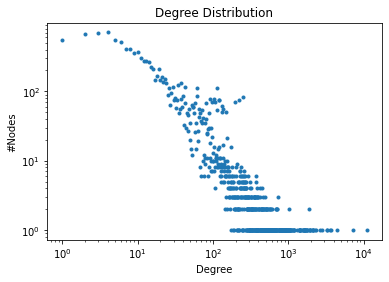

In [36]:
hist = nx.degree_histogram(G)
    
plt.plot(range(0, len(hist)), hist, ".")
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("#Nodes")
plt.loglog()
plt.show()